# Presidental elections in Ukraine in 2019

## Plan of analyzis

1. Import libraries
2. Import dataset
3. Data Processing and filtration
4. Test for normality 
5. Vizualization the data and finding the problems

### Import libraries

In [1]:
import os
import csv
import openpyxl

from openpyxl import load_workbook

import numpy as np
import pandas as pd
import swifter 

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

from threading import Thread
import seaborn as sns

import scipy.stats as stats

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, log_loss

### Import the data

Data contains two files: protokols and results
  Protokols - information about how many people visited election station and voted 
  Results - information about how many people voted for each candidate 

In [2]:
print(open('ElectionProtocols.csv'))

protokols_df = pd.read_csv('ElectionProtocols.csv', sep='\t')

protokols_df

<_io.TextIOWrapper name='ElectionProtocols.csv' mode='r' encoding='cp1251'>


,election_name,election_type,election_date,region,rayon,community,city_rayon,koatuu,district_no,district_desc,...,voted_home,voted_home_percent,voted_total,voted_total_percent,ballots_invalid,ballots_invalid_percent,votes_candidates,votes_againstall,votes_againstall_percent,approval_dt
0,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,...,NaN,NaN,1121,"66,48",20,"1,78",1101,0,0,01.04.2019 01:30
1,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,...,NaN,NaN,1358,"64,39",17,"1,25",1341,0,0,01.04.2019 00:50
2,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,...,NaN,NaN,841,"65,6",12,"1,42",822,0,0,02.04.2019 23:45
3,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,...,NaN,NaN,1594,"65,48",12,"0,75",1583,0,0,01.04.2019 19:00
4,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,...,NaN,NaN,140,"62,22",0,0,140,0,0,01.04.2019 00:10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29984,Вибори Президента України 2019,Чергові,31.03.2019,За межами України,NaN,NaN,NaN,9000000380,226,Закордонний виборчий округ,...,NaN,NaN,549,"13,02",9,"1,63",540,0,0,01.04.2019 01:40
29985,Вибори Президента України 2019,Чергові,31.03.2019,За межами України,NaN,NaN,NaN,9000000276,226,Закордонний виборчий округ,...,NaN,NaN,1441,"6,79",7,"0,48",1434,0,0,01.04.2019 01:20
29986,Вибори Президента України 2019,Чергові,31.03.2019,За межами України,NaN,NaN,NaN,9000000152,226,Закордонний виборчий округ,...,NaN,NaN,59,"64,83",0,0,59,0,0,31.03.2019 20:32
29987,Вибори Президента України 2019,Чергові,31.03.2019,За межами України,NaN,NaN,NaN,9000000792,226,Закордонний виборчий округ,...,NaN,NaN,122,"77,21",0,0,122,0,0,31.03.2019 22:40


In [3]:
protokols_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29989 entries, 0 to 29988
Data columns (total 34 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   election_name                  29989 non-null  object 
 1   election_type                  29989 non-null  object 
 2   election_date                  29989 non-null  object 
 3   region                         29989 non-null  object 
 4   rayon                          28782 non-null  object 
 5   community                      29888 non-null  object 
 6   city_rayon                     4999 non-null   object 
 7   koatuu                         29989 non-null  int64  
 8   district_no                    29989 non-null  int64  
 9   district_desc                  29989 non-null  object 
 10  precinct_no                    29989 non-null  int64  
 11  precinct_desc                  29909 non-null  object 
 12  ballots_amount                 29989 non-null 

In [4]:
protokols_df['voted_total_percent'] = protokols_df['voted_total_percent'].apply(lambda x: float(x.replace(',', '.')))

protokols_df['voted_total_percent']

0        66.48
1        64.39
2        65.60
3        65.48
4        62.22
         ...  
29984    13.02
29985     6.79
29986    64.83
29987    77.21
29988    26.27
Name: voted_total_percent, Length: 29989, dtype: float64

In [5]:
print(open('ElectionResults.csv'))

results_df = pd.read_csv('ElectionResults.csv', sep='\t')

results_df

<_io.TextIOWrapper name='ElectionResults.csv' mode='r' encoding='cp1251'>


d:\pyth3_8_5\lib\site-packages\IPython\core\interactiveshell.py:3145: DtypeWarning: Columns (4,6) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,election_name,election_type,election_date,region,rayon,community,city_rayon,koatuu,district_no,district_desc,precinct_no,precinct_desc,candidate,party,partisan,vote_count,vote_percent
0,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,50130,"смт Стрижавка – вул.Байдукова, вул.Бугова, вул...",Балашов Геннадій Вікторович,"Партія ""5.10""","Партія ""5.10""",3,"0,26"
1,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,50130,"смт Стрижавка – вул.Байдукова, вул.Бугова, вул...",Безсмертний Роман Петрович,Самовисування,Безпартійний,2,"0,17"
2,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,50130,"смт Стрижавка – вул.Байдукова, вул.Бугова, вул...",Богомолець Ольга Вадимівна,Самовисування,Безпартійний,2,"0,17"
3,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,50130,"смт Стрижавка – вул.Байдукова, вул.Бугова, вул...",Богословська Інна Германівна,Самовисування,Безпартійний,0,0
4,Вибори Президента України 2019,Чергові,31.03.2019,Вінницька область,Вінницький район,Стрижавська селищна рада,NaN,520655900,11,Центр: місто Вінниця. ТВО включає: частина міс...,50130,"смт Стрижавка – вул.Байдукова, вул.Бугова, вул...",Бойко Юрій Анатолійович,Самовисування,Опозиційний блок,32,"2,85"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1169566,Вибори Президента України 2019,Чергові,31.03.2019,За межами України,NaN,NaN,NaN,9000000124,226,Закордонний виборчий округ,900125,"Канада (провінції: Альберта, Британська Колумб...",Тарута Сергій Олексійович,Основа,Основа,0,0
1169567,Вибори Президента України 2019,Чергові,31.03.2019,За межами України,NaN,NaN,NaN,9000000124,226,Закордонний виборчий округ,900125,"Канада (провінції: Альберта, Британська Колумб...",Тимошенко Юлія Володимирівна,Батьківщина,Батьківщина,10,"4,31"
1169568,Вибори Президента України 2019,Чергові,31.03.2019,За межами України,NaN,NaN,NaN,9000000124,226,Закордонний виборчий округ,900125,"Канада (провінції: Альберта, Британська Колумб...",Тимошенко Юрій Володимирович,Самовисування,Безпартійний,0,0
1169569,Вибори Президента України 2019,Чергові,31.03.2019,За межами України,NaN,NaN,NaN,9000000124,226,Закордонний виборчий округ,900125,"Канада (провінції: Альберта, Британська Колумб...",Шевченко Ігор Анатолійович,Самовисування,Безпартійний,0,0


#### Information about data

In [6]:
results_df.describe()

,koatuu,district_no,precinct_no,vote_count
count,1.169571e+06,1.169571e+06,1.169571e+06,1.169571e+06
mean,4.293127e+09,1.205495e+02,4.263421e+05,1.596240e+01
std,2.316895e+09,6.121904e+01,2.328696e+05,5.637879e+01
min,5.101000e+08,1.100000e+01,1.000000e+00,0.000000e+00
25%,2.121287e+09,7.000000e+01,2.102100e+05,0.000000e+00
50%,4.625385e+09,1.260000e+02,4.619120e+05,0.000000e+00
75%,6.310138e+09,1.730000e+02,6.304410e+05,3.000000e+00
max,9.000001e+09,2.260000e+02,9.001250e+05,1.520000e+03


In [7]:
results_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1169571 entries, 0 to 1169570
Data columns (total 17 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   election_name  1169571 non-null  object
 1   election_type  1169571 non-null  object
 2   election_date  1169571 non-null  object
 3   region         1169571 non-null  object
 4   rayon          1122498 non-null  object
 5   community      1165632 non-null  object
 6   city_rayon     194961 non-null   object
 7   koatuu         1169571 non-null  int64 
 8   district_no    1169571 non-null  int64 
 9   district_desc  1169571 non-null  object
 10  precinct_no    1169571 non-null  int64 
 11  precinct_desc  1166451 non-null  object
 12  candidate      1169571 non-null  object
 13  party          1169571 non-null  object
 14  partisan       1169571 non-null  object
 15  vote_count     1169571 non-null  int64 
 16  vote_percent   1169571 non-null  object
dtypes: int64(4), object(13)
mem

In [8]:
# dropping the extra information
results_df = results_df.drop(columns=['election_name', 
                                      'election_type', 
                                      'election_date', 
                                      'city_rayon',
                                      'district_desc',
                                      'precinct_desc'])

In [9]:
results_df

,region,rayon,community,koatuu,district_no,precinct_no,candidate,party,partisan,vote_count,vote_percent
0,Вінницька область,Вінницький район,Стрижавська селищна рада,520655900,11,50130,Балашов Геннадій Вікторович,"Партія ""5.10""","Партія ""5.10""",3,"0,26"
1,Вінницька область,Вінницький район,Стрижавська селищна рада,520655900,11,50130,Безсмертний Роман Петрович,Самовисування,Безпартійний,2,"0,17"
2,Вінницька область,Вінницький район,Стрижавська селищна рада,520655900,11,50130,Богомолець Ольга Вадимівна,Самовисування,Безпартійний,2,"0,17"
3,Вінницька область,Вінницький район,Стрижавська селищна рада,520655900,11,50130,Богословська Інна Германівна,Самовисування,Безпартійний,0,0
4,Вінницька область,Вінницький район,Стрижавська селищна рада,520655900,11,50130,Бойко Юрій Анатолійович,Самовисування,Опозиційний блок,32,"2,85"
...,...,...,...,...,...,...,...,...,...,...,...
1169566,За межами України,NaN,NaN,9000000124,226,900125,Тарута Сергій Олексійович,Основа,Основа,0,0
1169567,За межами України,NaN,NaN,9000000124,226,900125,Тимошенко Юлія Володимирівна,Батьківщина,Батьківщина,10,"4,31"
1169568,За межами України,NaN,NaN,9000000124,226,900125,Тимошенко Юрій Володимирович,Самовисування,Безпартійний,0,0
1169569,За межами України,NaN,NaN,9000000124,226,900125,Шевченко Ігор Анатолійович,Самовисування,Безпартійний,0,0


Let's watch how many votes were for each party

In [10]:
results_df[['vote_count', 'party']].groupby('party').sum()


,vote_count
party,
Батьківщина,2532452
Воля,19542
Відродження,22564
Громадянська позиція,1306450
Народний Рух,9243
Опозиційний блок – партія миру та розвитку,784274
Основа,18918
"Партія ""5.10""",32872
Патріот,5587


Let's watch num of votes per each candidate

In [11]:
# groupping results per candidate
votes_per_candidate = results_df[['vote_count', 'candidate']].groupby('candidate').sum().reset_index()
# sum_votes is sum of all votes in elections
sum_votes = protokols_df['votes_candidates'].sum()
# view the votes per candidate
votes_per_candidate

,candidate,vote_count
0,Балашов Геннадій Вікторович,32872
1,Безсмертний Роман Петрович,27182
2,Богомолець Ольга Вадимівна,33966
3,Богословська Інна Германівна,18482
4,Бойко Юрій Анатолійович,2206216
5,Бондар Віктор Васильович,22564
6,Ващенко Олександр Михайлович,5503
7,Вілкул Олександр Юрійович,784274
8,Габер Микола Олександрович,5433
9,Гриценко Анатолій Степанович,1306450


Make a sample with candidates can cross the border of 5% of votes

In [12]:
# creating dataframe for finding the percent of votes per every candidate
candidate_percent = pd.DataFrame()
candidate_percent['candidate'] = votes_per_candidate['candidate']
candidate_percent['candidate_percent'] = votes_per_candidate['vote_count'] / sum_votes * 100

# filtering only candidates with more than 5% of votes
concurence_candidates = candidate_percent[candidate_percent['candidate_percent'] > 5]['candidate'].to_list()
# concurence_candidates is a list of candidates with > 5% of elections
concurence_candidates

['Бойко Юрій Анатолійович',
 'Гриценко Анатолій Степанович',
 'Зеленський Володимир Олександрович',
 'Ляшко Олег Валерійович',
 'Порошенко Петро Олексійович',
 'Смешко Ігор Петрович',
 'Тимошенко Юлія Володимирівна']

In [13]:
results_df[['vote_count']].sum()

vote_count    18669164
dtype: int64

In [14]:
protokols_df['votes_candidates'].sum()

18669164

Let's watch the distribution of votes per region and see the difference between protokols and results file 

In [15]:
results_df[['region', 'vote_count']].groupby('region').sum()

,vote_count
region,
Івано-Франківська область,642930
Волинська область,514692
Вінницька область,790432
Дніпропетровська область,1628887
Донецька область,836485
Житомирська область,611361
За межами України,54694
Закарпатська область,433665
Запорізька область,862465


In [16]:
protokols_df[['region', 'votes_candidates']].groupby('region').sum()

,votes_candidates
region,
Івано-Франківська область,642930
Волинська область,514692
Вінницька область,790432
Дніпропетровська область,1628887
Донецька область,836485
Житомирська область,611361
За межами України,54694
Закарпатська область,433665
Запорізька область,862465


There are no difference

#### Distribution of score votes in precints

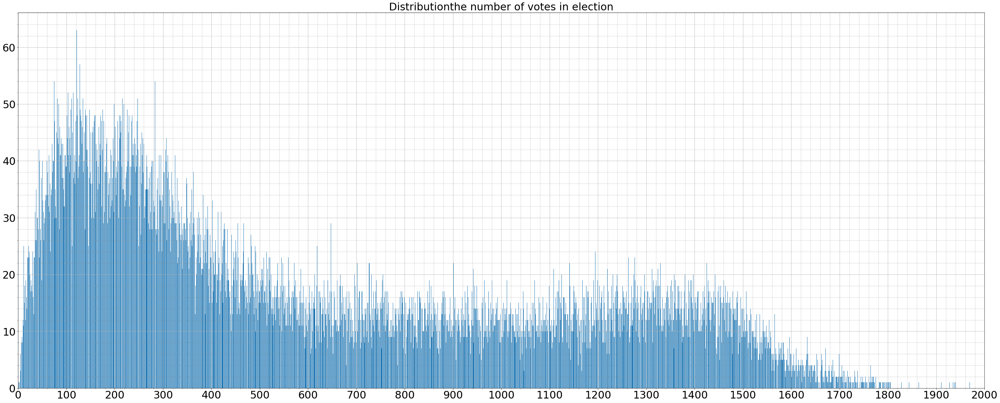

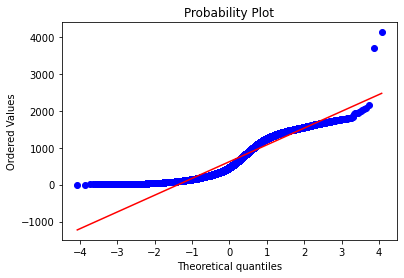

      votes_candidates  count
0                    1      1
1                    2      1
2                    4      6
3                    5      3
4                    6      8
...                ...    ...
1772              2056      1
1773              2081      1
1774              2150      1
1775              3712      1
1776              4129      1

[1777 rows x 2 columns]
median:  467.0


In [17]:
# function which print simple histogram 
def plot_plt_histogram(set_x, bins, grid=False, hight=70, weight=100, fontsize=30,
                       need_xlim=False, xlim=1000, xmin=0,
                       need_ylim=False, ylim=1000, ymin=0,
                       need_tick=False, tick_x=100, tick_y=100,
                       hist_name='Histogram'):
    # plotting the histogram
    fig = plt.figure(figsize=(weight, hight))
    ax = fig.add_subplot(111)
    ax.hist(set_x, bins=bins)
    if need_xlim == True:
        plt.xlim(xmin, xlim)
    if need_ylim == True:
        plt.ylim(ymin, ylim)
    plt.title(hist_name, fontsize=fontsize)
    plt.grid(grid)
                # adding the ticks
    if need_tick == True:
        ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_x))
        ax.xaxis.set_minor_locator(ticker.MultipleLocator(tick_x / 2))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_y))
        ax.yaxis.set_minor_locator(ticker.MultipleLocator(tick_y / 2))
        ax.minorticks_on()
        ax.grid(which='minor',
                    color = 'gray',
                    linestyle = ':')
        plt.tick_params(axis='x', labelsize=fontsize)
        plt.tick_params(axis='y', labelsize=fontsize)
    plt.show()
    

    
# printing the histogram    
plot_plt_histogram(protokols_df['votes_candidates'], bins=protokols_df['votes_candidates'].shape[0]//5,
                   grid=True, hight=20, weight=50, need_tick=True, tick_x=100, tick_y=10, 
                   hist_name='Distributionthe number of votes in election',
                   need_xlim=True, xlim=2000)

# information about distribution the data
hist = protokols_df['votes_candidates'].groupby(protokols_df['votes_candidates']).count()
hist = pd.DataFrame(hist).rename(columns={'votes_candidates' : 'count'}).reset_index()
# testing that distribution is normal
stats.probplot(protokols_df['votes_candidates'], dist='norm', plot=plt)
plt.show()
# print information about distribution the data 
print(hist)
print('median: ', protokols_df['votes_candidates'].median())

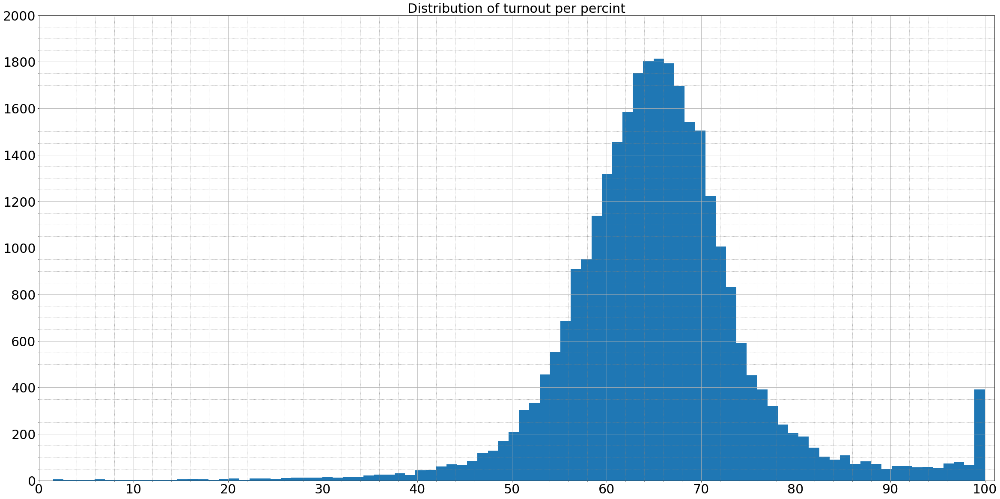

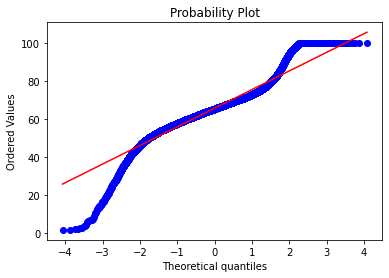

      voted_total_percent  count
0                    1.50      1
1                    1.67      1
2                    2.12      1
3                    2.13      1
4                    2.48      1
...                   ...    ...
4576                99.81      1
4577                99.82      1
4578                99.83      1
4579                99.84      2
4580               100.00    332

[4581 rows x 2 columns]
median:  65.23


In [18]:
# printing the histogram    
plot_plt_histogram(protokols_df['voted_total_percent'], bins=90,
                   grid=True, hight=20, weight=40, fontsize=30,
                   need_ylim=True, ylim=2000, need_tick=True, tick_x=10, tick_y=200,
                   need_xlim=True, xlim=101,
                   hist_name='Distribution of turnout per percint')

# information about distribution the data
hist = protokols_df['voted_total_percent'].groupby(protokols_df['voted_total_percent']).count()
hist = pd.DataFrame(hist).rename(columns={'voted_total_percent' : 'count'}).reset_index()
# testing that distribution is normal
stats.probplot(protokols_df['voted_total_percent'], dist='norm', plot=plt)
plt.show()
# print information about distribution the data 
print(hist)
print('median: ', protokols_df['voted_total_percent'].median())

## The distribution of votes per turnout in precints. Rounded to 1% step.

In [19]:
# function which print the simple plot
def print_plot(x, y, need_z=False, z=0, 
              grid=True, hight=5, weight=8, 
              need_legend=False, legend_y='', legend_z='', legend_fontsize=20, 
              plot_name='', color='C1',
              need_xlim=False, xlim=0, xmin=0, need_ylim=False, ylim=0, ymin=0,
              need_label = False, ylabel='', xlabel='',
              need_tick=False, tick_x=5, tick_y=100):
    # print the plot
    fig = plt.figure(figsize=(weight, hight))
    ax = fig.add_subplot(111)
    ax.plot(x, y, color)
    if need_z == True:
        ax.plot(z)
    ax.grid(grid, which='major')
    ax.set_title(plot_name, fontsize=legend_fontsize)
    if need_tick == True:
        ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_x))
        ax.xaxis.set_minor_locator(ticker.MultipleLocator(tick_x / 2))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_y))
        ax.yaxis.set_minor_locator(ticker.MultipleLocator(tick_y / 2))
        ax.minorticks_on()
        ax.grid(which='minor',
                    color = 'gray',
                    linestyle = ':')
    if need_label == True:
        plt.xlabel(xlabel, fontsize=legend_fontsize)
        plt.ylabel(ylabel, fontsize=legend_fontsize)
    if need_legend == True:
        ax.legend((legend_y, legend_z), frameon=True, fontsize=legend_fontsize)
    if need_xlim == True:
        plt.xlim(xmin, xlim)
    if need_ylim == True:
        plt.ylim(ymin, ylim)
    plt.show()

    

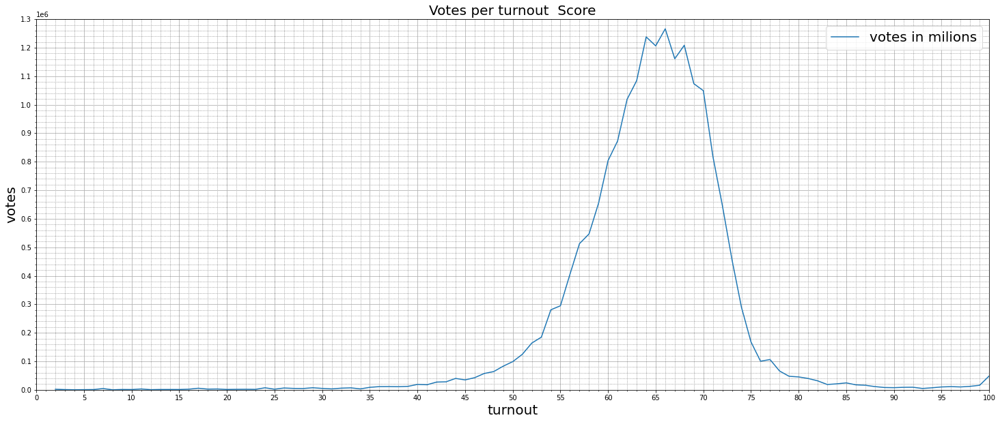

,voted_total_percent_rounded,voted_total
0,2.0,1973
1,3.0,794
2,4.0,175
3,6.0,870
4,7.0,4510
...,...,...
93,96.0,11209
94,97.0,10126
95,98.0,12200
96,99.0,15985


In [20]:
# preprocessing data in protokols
protokols_df['voted_total_percent_rounded'] = protokols_df['voted_total_percent'].round(0).copy()
voted_total_percent = protokols_df[['voted_total', 'voted_total_percent_rounded']].groupby(
                                                                                    'voted_total_percent_rounded').sum()
voted_total_percent = pd.DataFrame(voted_total_percent).reset_index()

# printing the distribution of number of voted_total and voted_total_percent
print_plot(voted_total_percent['voted_total_percent_rounded'], voted_total_percent['voted_total'], 
           plot_name='Votes per turnout  Score', hight=10, weight=25, grid=True, color='C0', 
           need_legend=True, legend_y='votes in milions', legend_fontsize=20,
           need_label = True, ylabel='votes', xlabel='turnout',
           need_xlim=True, xlim=100, xmin=0, need_ylim=True, ylim=1300000, ymin=0,
           need_tick=True, tick_x=5, tick_y=100000)
voted_total_percent

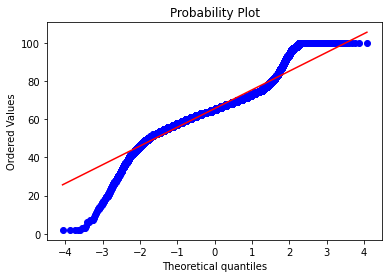

In [21]:
# testing that distribution is normal
stats.probplot(protokols_df['voted_total_percent_rounded'], dist='norm', plot=plt)
plt.show()

In [22]:
# printing the distribution of vote_count per every candidate in each precint
results_df[['precinct_no', 'candidate', 'vote_count']]


,precinct_no,candidate,vote_count
0,50130,Балашов Геннадій Вікторович,3
1,50130,Безсмертний Роман Петрович,2
2,50130,Богомолець Ольга Вадимівна,2
3,50130,Богословська Інна Германівна,0
4,50130,Бойко Юрій Анатолійович,32
...,...,...,...
1169566,900125,Тарута Сергій Олексійович,0
1169567,900125,Тимошенко Юлія Володимирівна,10
1169568,900125,Тимошенко Юрій Володимирович,0
1169569,900125,Шевченко Ігор Анатолійович,0


In [23]:
# grouping results by candidate and precint
results_total = results_df[['district_no', 
                            'precinct_no', 
                            'candidate', 
                            'vote_count']].groupby(['candidate',
                                                    'district_no', 
                                                    'precinct_no']).sum().reset_index()

# let's watch the result for Zelensky in 12's district
results_total[(results_total['candidate'] == 'Зеленський Володимир Олександрович') & (results_total['district_no'] == 12)]

,candidate,district_no,precinct_no,vote_count
389971,Зеленський Володимир Олександрович,12,1,239
389972,Зеленський Володимир Олександрович,12,50125,94
389973,Зеленський Володимир Олександрович,12,50126,281
389974,Зеленський Володимир Олександрович,12,50127,176
389975,Зеленський Володимир Олександрович,12,50128,153
...,...,...,...,...
390082,Зеленський Володимир Олександрович,12,51588,13
390083,Зеленський Володимир Олександрович,12,51589,107
390084,Зеленський Володимир Олександрович,12,51590,100
390085,Зеленський Володимир Олександрович,12,51670,343


In [24]:
results_total_joined = results_total.join(protokols_df[['region', 'rayon', 'community',
                                                 'district_no', 
                                                 'precinct_no',
                                                 'votes_candidates',
                                                 'voted_total_percent_rounded']].set_index(['district_no','precinct_no']), 
                                   on=['district_no', 'precinct_no'], how='right')

results_total_joined

,candidate,district_no,precinct_no,vote_count,region,rayon,community,votes_candidates,voted_total_percent_rounded
0,Балашов Геннадій Вікторович,11,50130,3,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.0
29989,Безсмертний Роман Петрович,11,50130,2,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.0
59978,Богомолець Ольга Вадимівна,11,50130,2,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.0
89967,Богословська Інна Германівна,11,50130,0,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.0
119956,Бойко Юрій Анатолійович,11,50130,32,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.0
...,...,...,...,...,...,...,...,...,...
1049614,Тарута Сергій Олексійович,226,900125,0,За межами України,NaN,NaN,232,26.0
1079603,Тимошенко Юлія Володимирівна,226,900125,10,За межами України,NaN,NaN,232,26.0
1109592,Тимошенко Юрій Володимирович,226,900125,0,За межами України,NaN,NaN,232,26.0
1139581,Шевченко Ігор Анатолійович,226,900125,0,За межами України,NaN,NaN,232,26.0


In [25]:
results_total = results_total_joined.groupby(['candidate', 'voted_total_percent_rounded']).sum().reset_index()
results_total

,candidate,voted_total_percent_rounded,district_no,precinct_no,vote_count,votes_candidates
0,Балашов Геннадій Вікторович,2.0,964,3740649,9,1960
1,Балашов Геннадій Вікторович,3.0,678,2700109,5,786
2,Балашов Геннадій Вікторович,4.0,226,900099,0,174
3,Балашов Геннадій Вікторович,6.0,524,2010605,7,861
4,Балашов Геннадій Вікторович,7.0,1130,4500255,20,4483
...,...,...,...,...,...,...
3817,Шевченко Олександр Леонідович,96.0,9376,31699644,45,10852
3818,Шевченко Олександр Леонідович,97.0,6701,22773657,71,9773
3819,Шевченко Олександр Леонідович,98.0,6938,23116403,45,11757
3820,Шевченко Олександр Леонідович,99.0,5746,16231457,67,15241


In [26]:
protokols_df[['voted_total_percent_rounded', 'voted_total',
                'precinct_no', 'district_no']][(protokols_df['district_no'] == 12)  & (protokols_df['precinct_no'] == 1)]

,voted_total_percent_rounded,voted_total,precinct_no,district_no
114,99.0,706,1,12


In [27]:
# select the first candidate for creating the first plot
first_candidate = concurence_candidates[0]
x = results_total.reset_index()['voted_total_percent_rounded'][results_total['candidate'] == first_candidate]
y = results_total['vote_count'][results_total['candidate'] == first_candidate]
y


392     281
393     169
394      11
395      46
396     257
       ... 
485    1335
486    1237
487    1023
488    1219
489    3235
Name: vote_count, Length: 98, dtype: int64

In [28]:
# function for printing the any nums of plots in one figure with common x-axis
def print_multiply_plot(dataset, x_column='', y_column='', target_column='', target_list=[], mult_type='in_one',
              grid=True, hight=5, weight=8, 
              need_legend=False, legend_fontsize=20, 
              plot_name='scatter', color='C1',
              need_xlim=False, xlim=0, xmin=0, need_ylim=False, ylim=0, ymin=0,
              need_label = False, ylabel='', xlabel='', need_print = 'N',
              need_tick=False, tick_x=5, tick_y=100):
    # mult_type = ['in_one', 'in_differ']
    
    # x cannot be changed
    # sampling the x
    x = dataset[x_column][dataset[target_column] == target_list[0]]
    
    if mult_type == 'in_one':
        fig = plt.figure(figsize=(weight, hight))
        ax = fig.add_subplot(111)
        # tittle
        ax.set_title(plot_name, fontsize=legend_fontsize)

        # labels for every axis
        plt.xlabel(xlabel, fontsize=legend_fontsize)
        plt.ylabel(ylabel, fontsize=legend_fontsize)

        # grid 
        ax.grid(True, which='major')

        # adding the tickers
        ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_x))
        ax.xaxis.set_minor_locator(ticker.MultipleLocator(tick_x / 2))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_y))
        ax.yaxis.set_minor_locator(ticker.MultipleLocator(tick_x / 2))
        ax.minorticks_on()
        ax.grid(which='minor',color = 'gray', linestyle = ':')

        plt.xlim(xmin, xlim)
        plt.ylim(ymin, ylim)

        # adding others plots
        for element in target_list:   
            y = dataset[y_column][dataset[target_column] == element]
            ax.plot(x, y)
            
        # legend
        if need_legend == True:
            ax.legend(target_list, frameon=True, fontsize=legend_fontsize, markerscale=5.0)
        plt.savefig(plot_name+'.jpg')
        # printing if need
        if need_print == 'Y':
            plt.show() 
        
    if mult_type == 'in_differ':
        for element in target_list:
            fig = plt.figure(figsize=(weight, hight))
            ax = fig.add_subplot(111)
            # tittle
            ax.set_title(plot_name, fontsize=font_size)

            # labels for every axis
            plt.xlabel(xlabel, fontsize=font_size)
            plt.ylabel(ylabel, fontsize=font_size)

            # grid 
            ax.grid(True, which='major')

            # adding the tickers
            ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_x))
            ax.xaxis.set_minor_locator(ticker.MultipleLocator(tick_x / 2))
            ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_y))
            ax.yaxis.set_minor_locator(ticker.MultipleLocator(tick_y / 2))
            ax.minorticks_on()
            ax.grid(which='minor',color = 'gray', linestyle = ':')

            plt.xlim(xmin, xlim)
            plt.ylim(ymin, ylim)            
            
            y = dataset[y_column][dataset[target_column] == element]
            element_color = 'C' + str(target_list.index(element))
            
            ax.plot(x, y, color=element_color)
            
            # legend
            if need_legend == True:
                ax.legend(target_list, frameon=True, fontsize=legend_fontsize, markerscale=5.0)
            plt.savefig(plot_name+element+'.jpg')
            # printing if need 
            if need_print == 'Y':
                plt.show()  

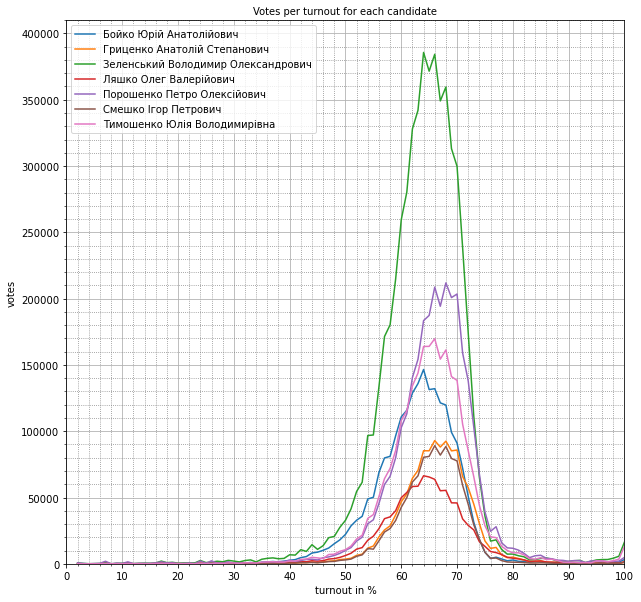

In [29]:
# variables for plotting
weight, hight = 10 , 10
font_size = 10
xlabel = 'turnout in %'
ylabel = 'votes'
tick_x = 10
tick_y = 50000
plot_name = 'Votes per turnout for each candidate'
xmin, xlim = 0, 100
ymin, ylim = 0, 410000
dataset = results_total
x_column = 'voted_total_percent_rounded'
y_column = 'vote_count'
target_column = 'candidate'
target_list = concurence_candidates

print_multiply_plot(dataset, x_column=x_column, y_column=y_column, 
              target_column=target_column, target_list=target_list, mult_type='in_one',
              grid=True, hight=hight, weight=weight, 
              need_legend=True, legend_fontsize=font_size, 
              plot_name=plot_name,
              need_xlim=True, xlim=100, xmin=0, need_ylim=True, ylim=410000, ymin=0,
              need_label = True, ylabel=ylabel, xlabel=xlabel,
              need_tick=True, tick_x=tick_x, tick_y=tick_y)

In [30]:
# grouping the results by candidate, district and precint for getting sum of votes 
results_total = results_df[['district_no', 
                            'precinct_no', 
                            'candidate', 
                            'vote_count',
                           ]].groupby(['candidate',
                                        'district_no', 
                                        'precinct_no']).sum().reset_index()
# merging the protokols for getting info about precints and all votes per precints
results_total = results_total.join(protokols_df[['region', 'rayon', 'community',
                                                 'district_no', 
                                                 'precinct_no',
                                                 'votes_candidates',
                                                 'voted_total_percent']].set_index(['district_no','precinct_no']), 
                                   on=['district_no', 'precinct_no'], how='left')
# finding the percents of votes in precint per all votes in precint
results_total['candidate_percent_per_precint'] = results_total['vote_count'] / results_total['votes_candidates'] * 100
results_total

,candidate,district_no,precinct_no,vote_count,region,rayon,community,votes_candidates,voted_total_percent,candidate_percent_per_precint
0,Балашов Геннадій Вікторович,11,50130,3,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.48,0.272480
1,Балашов Геннадій Вікторович,11,50131,1,Вінницька область,Вінницький район,Стрижавська селищна рада,1341,64.39,0.074571
2,Балашов Геннадій Вікторович,11,50132,1,Вінницька область,Вінницький район,Стрижавська селищна рада,822,65.60,0.121655
3,Балашов Геннадій Вікторович,11,50133,2,Вінницька область,Вінницький район,Стрижавська селищна рада,1583,65.48,0.126342
4,Балашов Геннадій Вікторович,11,50134,1,Вінницька область,Вінницький район,Стрижавська селищна рада,140,62.22,0.714286
...,...,...,...,...,...,...,...,...,...,...
1169566,Шевченко Олександр Леонідович,226,900121,1,За межами України,NaN,NaN,540,13.02,0.185185
1169567,Шевченко Олександр Леонідович,226,900122,0,За межами України,NaN,NaN,1434,6.79,0.000000
1169568,Шевченко Олександр Леонідович,226,900123,0,За межами України,NaN,NaN,59,64.83,0.000000
1169569,Шевченко Олександр Леонідович,226,900124,0,За межами України,NaN,NaN,122,77.21,0.000000


In [31]:
# function which print the multiply identical plots with common x=axis
def print_multiply_scatter(dataset, x_column='', y_column='', target_column='', target_list=[], mult_type='in_one',
              grid=True, hight=5, weight=8, 
              need_legend=False, legend_fontsize=20, 
              plot_name='scatter', color='C1',
              need_xlim=False, xlim=0, xmin=0, need_ylim=False, ylim=0, ymin=0,
              need_label = False, ylabel='', xlabel='', need_print='N',
              need_tick=False, tick_x=5, tick_y=100):
    # mult_type = ['in_one', 'in_differ']
    
    # x cannot be changed
    # sampling the x
    x = dataset[x_column][dataset[target_column] == target_list[0]]
    
    # checking mult_type
    if mult_type == 'in_one':
            # print the plot
        fig = plt.figure(figsize=(weight, hight), dpi=100, frameon=False)
        ax = fig.add_subplot(111)
            # adding the grid
        ax.grid(grid, which='major')
        ax.set_title(plot_name, fontsize=legend_fontsize)
    
        # adding the title
        if need_tick == True:
            ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_x))
            ax.xaxis.set_minor_locator(ticker.MultipleLocator(tick_x / 2))
            ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_y))
            ax.yaxis.set_minor_locator(ticker.MultipleLocator(tick_y / 2))
            ax.minorticks_on()
            ax.grid(which='minor',
                    color = 'gray',
                    linestyle = ':')
            plt.tick_params(axis='x', labelsize=legend_fontsize)
            plt.tick_params(axis='y', labelsize=legend_fontsize)
        if need_label == True:
            plt.xlabel(xlabel, fontsize=legend_fontsize)
            plt.ylabel(ylabel, fontsize=legend_fontsize)
        if need_xlim == True:
            plt.xlim(xmin, xlim)
        if need_ylim == True:
            plt.ylim(ymin, ylim)
            # cycle for getting the plot from sample of y

        # cycle for getting the plot from sample of y
    for element in target_list:
        if mult_type == 'in_differ':
            fig = plt.figure(figsize=(weight, hight), dpi=100, frameon=False)
            ax = fig.add_subplot(111)
    
            # adding the grid
            ax.grid(grid, which='major')
            ax.set_title(plot_name, fontsize=legend_fontsize)
    
            # adding the ticks
            if need_tick == True:
                ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_x))
                ax.xaxis.set_minor_locator(ticker.MultipleLocator(tick_x / 2))
                ax.yaxis.set_major_locator(ticker.MultipleLocator(tick_y))
                ax.yaxis.set_minor_locator(ticker.MultipleLocator(tick_y / 2))
                ax.minorticks_on()
                ax.grid(which='minor',
                    color = 'gray',
                    linestyle = ':')
                plt.tick_params(axis='x', labelsize=legend_fontsize)
                plt.tick_params(axis='y', labelsize=legend_fontsize)
            # adding the label 
            if need_label == True:
                plt.xlabel(xlabel, fontsize=legend_fontsize)
                plt.ylabel(ylabel, fontsize=legend_fontsize)
            if need_xlim == True:
                plt.xlim(xmin, xlim)
            if need_ylim == True:
                plt.ylim(ymin, ylim)  
            
            y = dataset[y_column][dataset[target_column] == element]
            
            element_color = 'C' + str(target_list.index(element))
            ax.scatter(x, y, c=element_color, s=0.7)
            if need_legend == True:
                ax.legend([element], frameon=True, fontsize=legend_fontsize, markerscale=legend_fontsize//2)
            plt.savefig(plot_name+str(element)+'.jpg')
            if need_print == 'Y':
                plt.show()
        else:
            y = dataset[y_column][dataset[target_column] == element]
            ax.scatter(x, y, s=0.7)
                       
    if mult_type == 'in_one':
        if need_legend == True:
            ax.legend(target_list, frameon=True, fontsize=legend_fontsize, markerscale=legend_fontsize//2) 
        plt.savefig(plot_name+'.jpg')
        if need_print == 'Y':
            plt.show()   

<ipython-input-31-f606a0e6f12b>:92: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(plot_name+'.jpg')
d:\pyth3_8_5\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


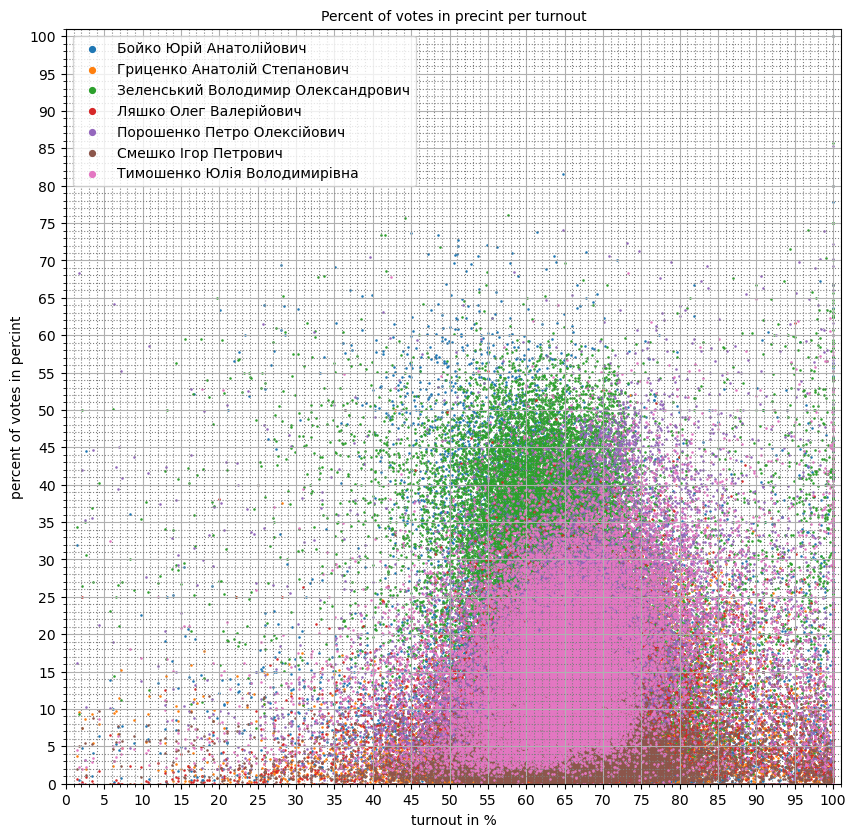

In [32]:
# prnting the percent's distribution for every candidate in one plot
print_multiply_scatter(results_total, x_column='voted_total_percent', y_column='candidate_percent_per_precint', 
              target_column='candidate', target_list=concurence_candidates, mult_type='in_one',
              grid=True, hight=10, weight=10, 
              need_legend=True, legend_fontsize=10,
              plot_name='Percent of votes in precint per turnout',
              need_xlim=True, xlim=101, xmin=0, need_ylim=True, ylim=101, ymin=0,
              need_label=True, ylabel='percent of votes in percint', xlabel='turnout in %', need_print='Y',
              need_tick=True, tick_x=5, tick_y=5)        


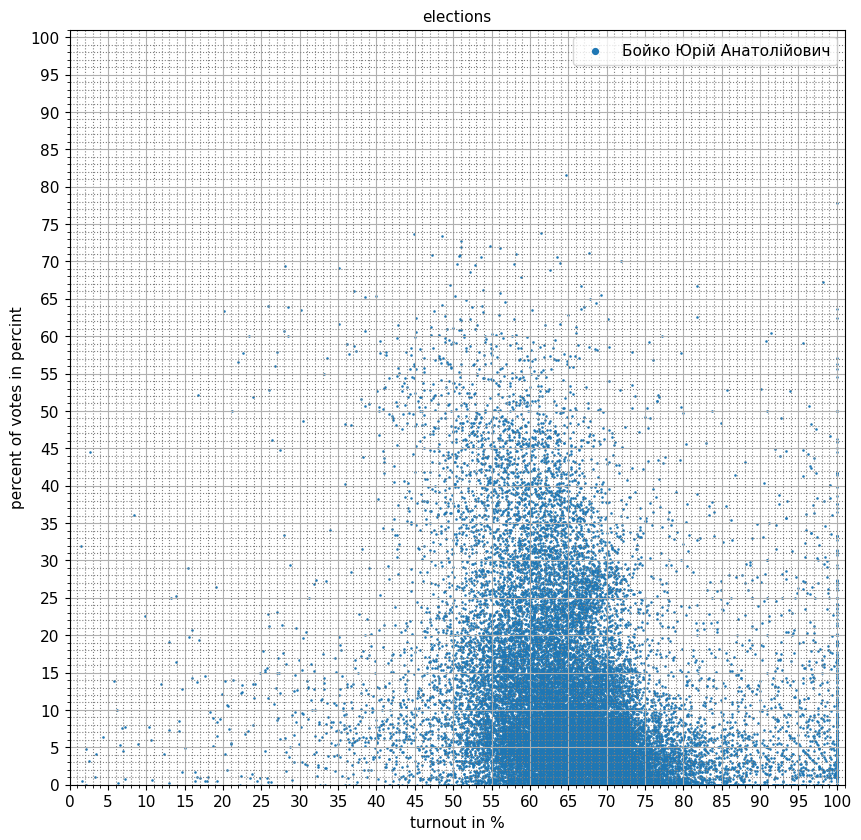

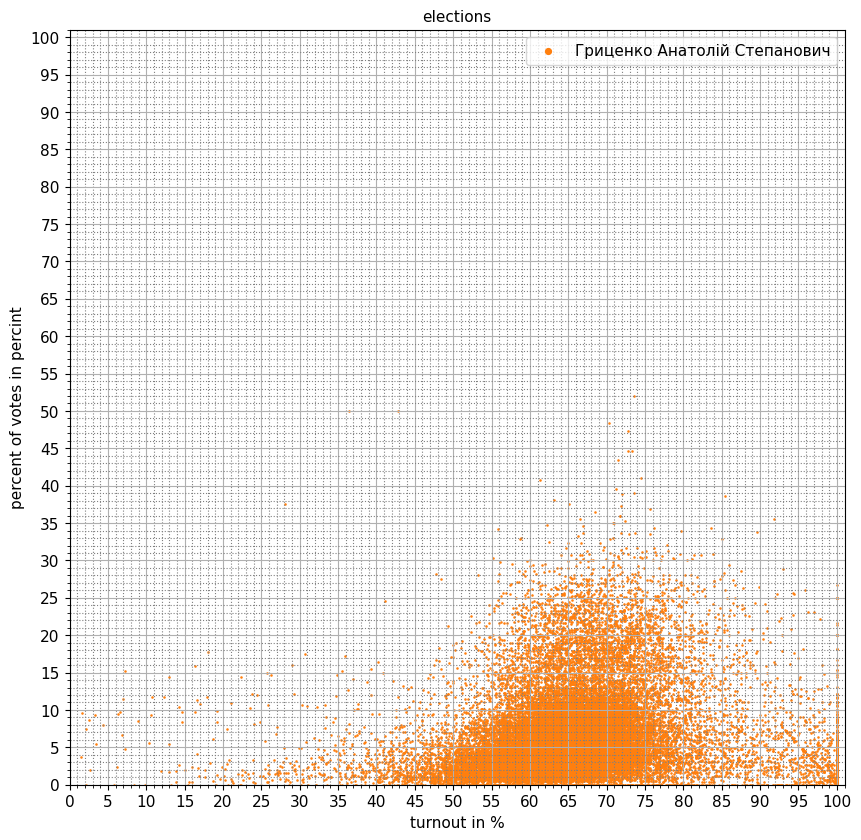

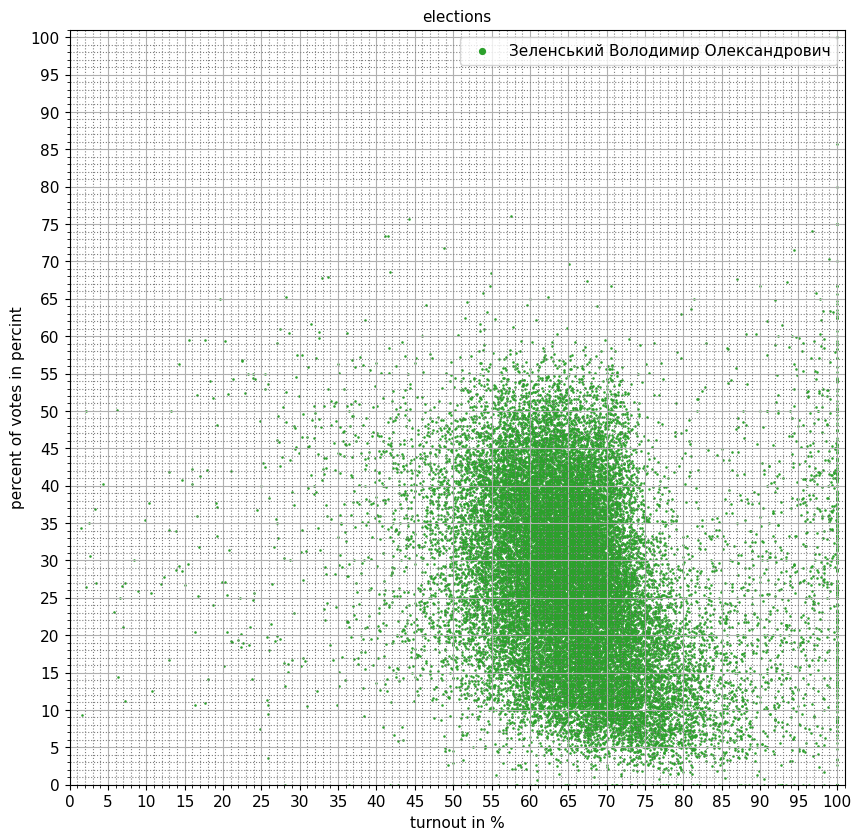

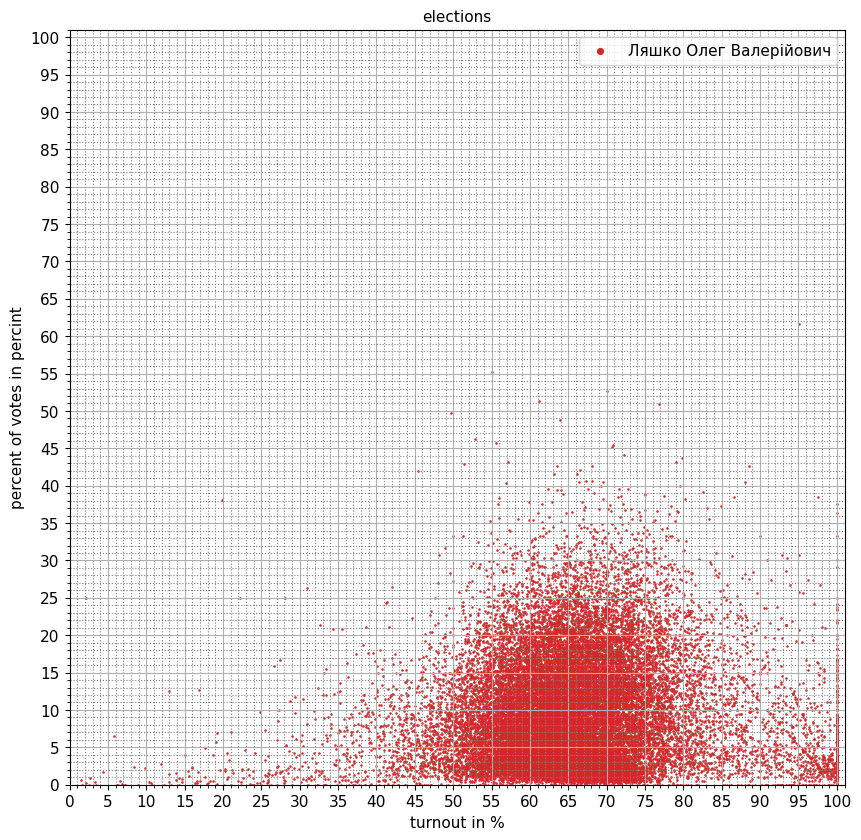

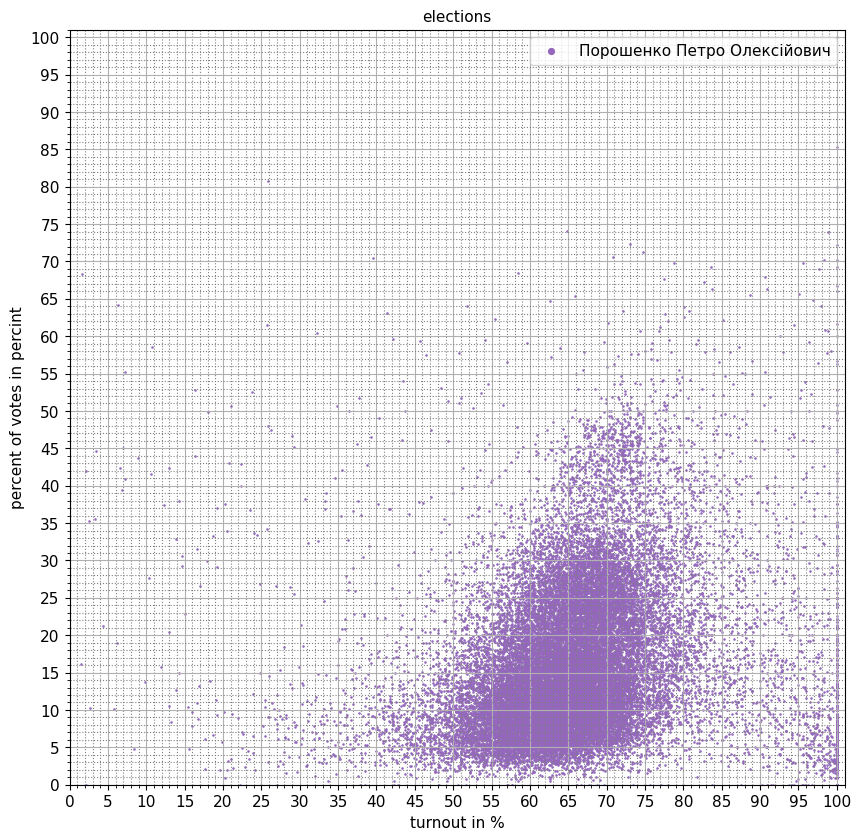

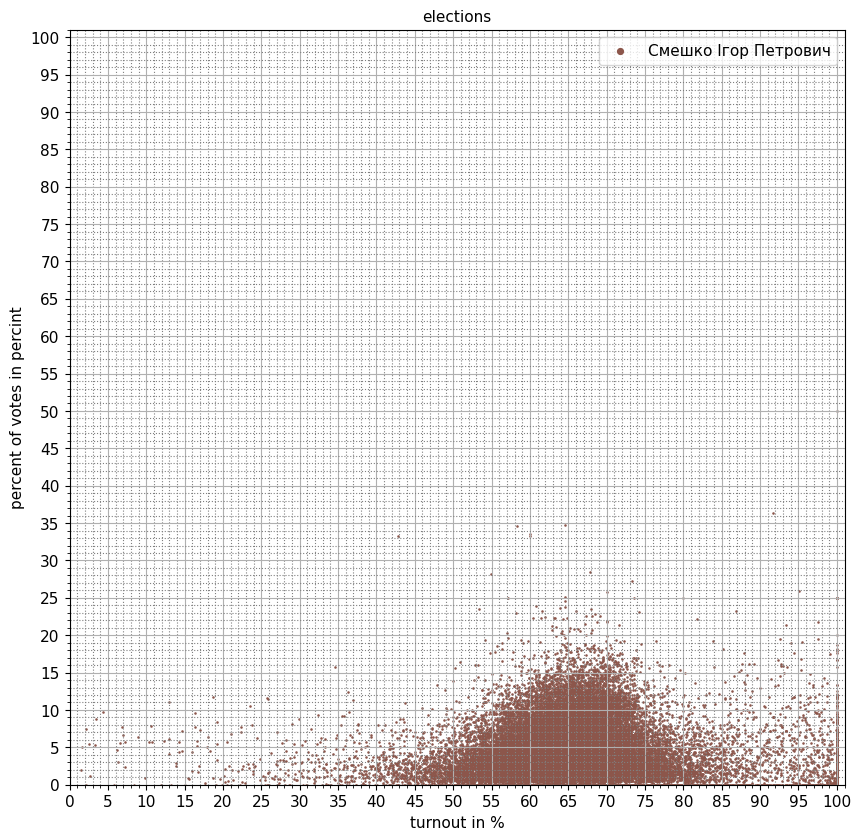

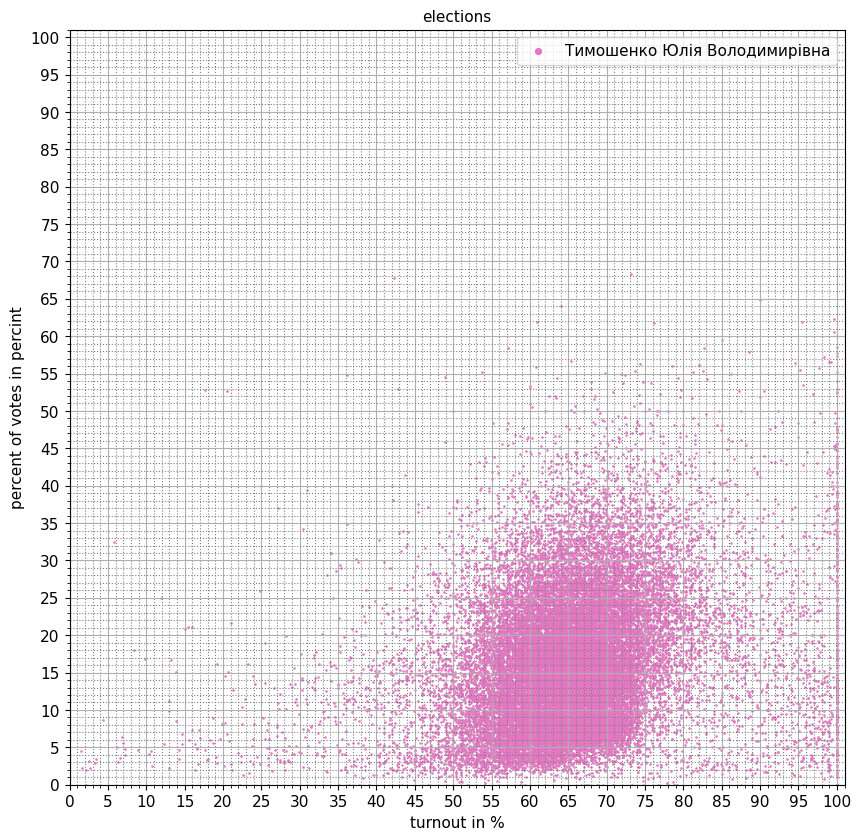

In [33]:
print_multiply_scatter(results_total, x_column='voted_total_percent', y_column='candidate_percent_per_precint', 
              target_column='candidate', target_list=concurence_candidates, mult_type='in_differ',
              grid=True, hight=10, weight=10, 
              need_legend=True, legend_fontsize=11,
              plot_name='elections',
              need_xlim=True, xlim=101, xmin=0, need_ylim=True, ylim=101, ymin=0,
              need_label=True, ylabel='percent of votes in percint', xlabel='turnout in %',
              need_tick=True, tick_x=5, tick_y=5) 

#### For every region

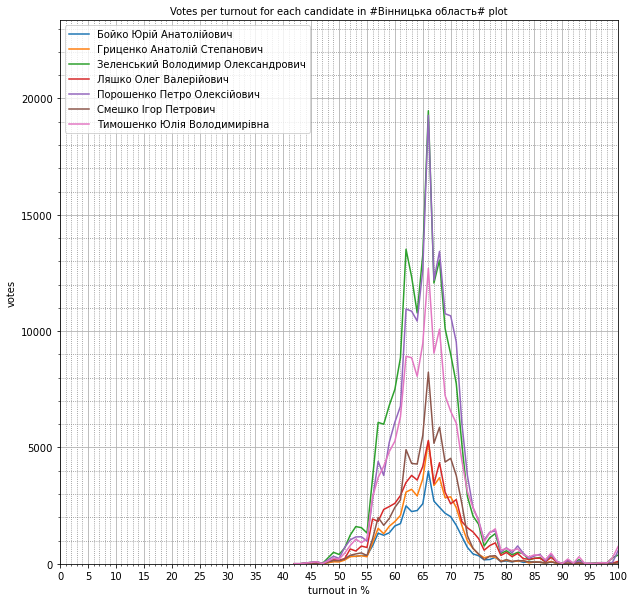

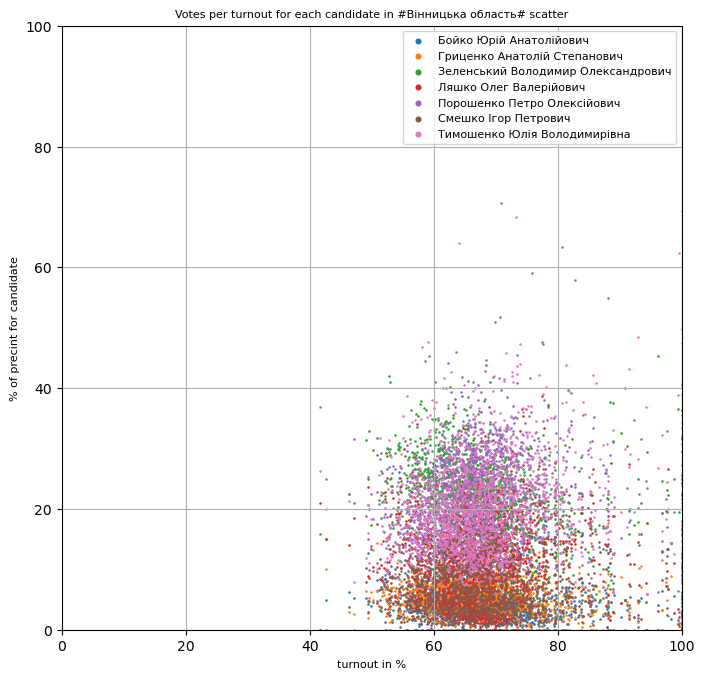

____________________________ Вінницька область ________________________________________________________________________


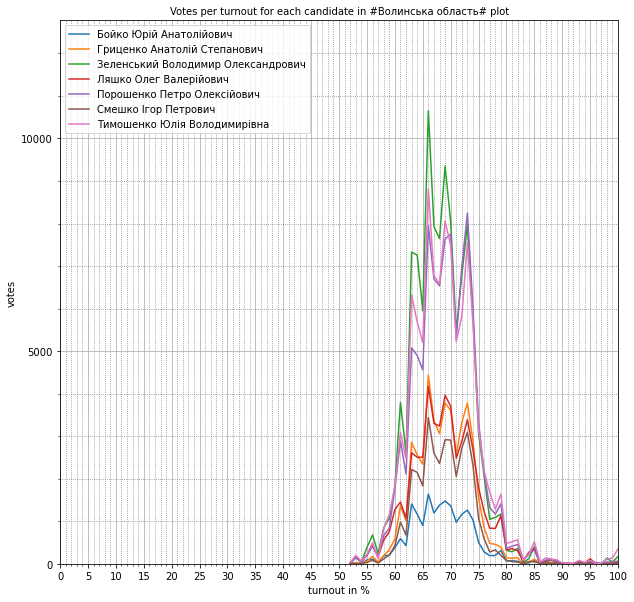

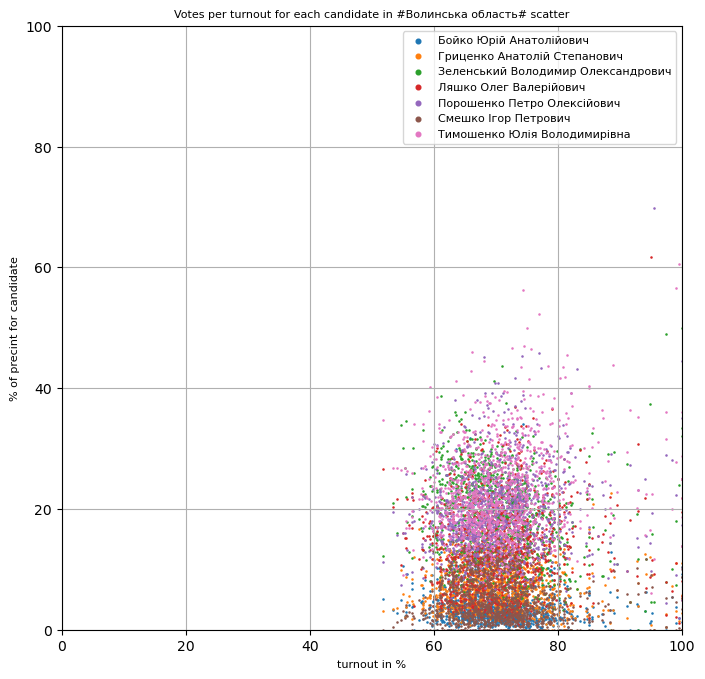

____________________________ Волинська область ________________________________________________________________________


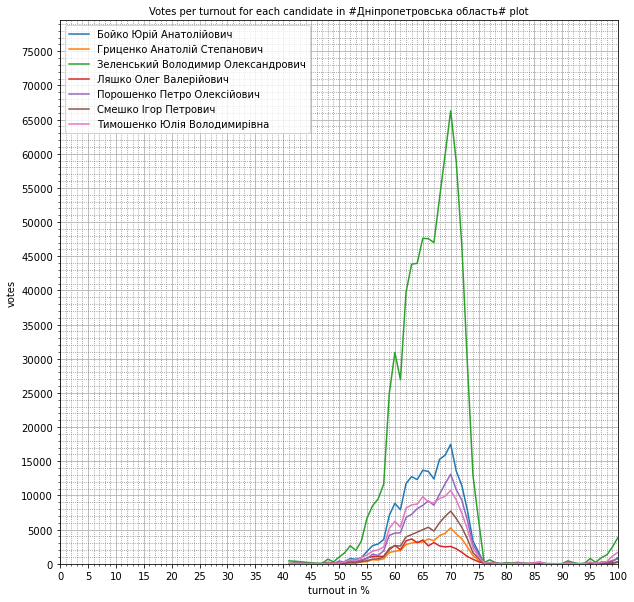

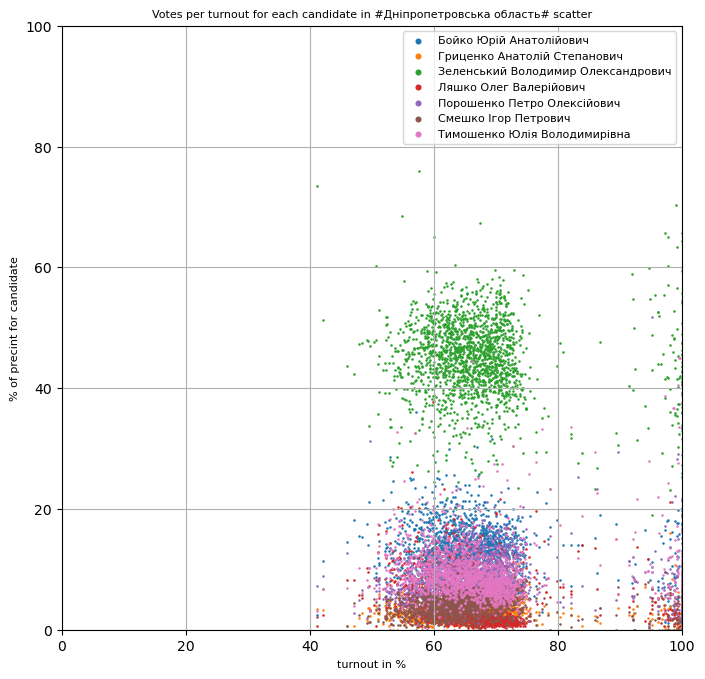

____________________________ Дніпропетровська область ________________________________________________________________________


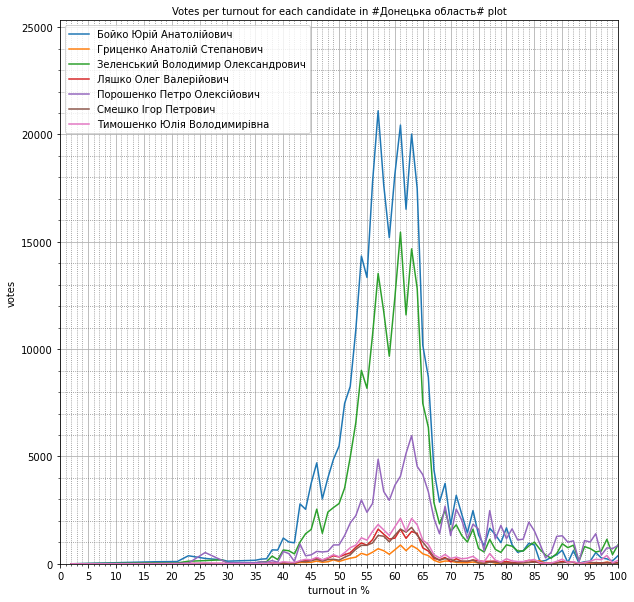

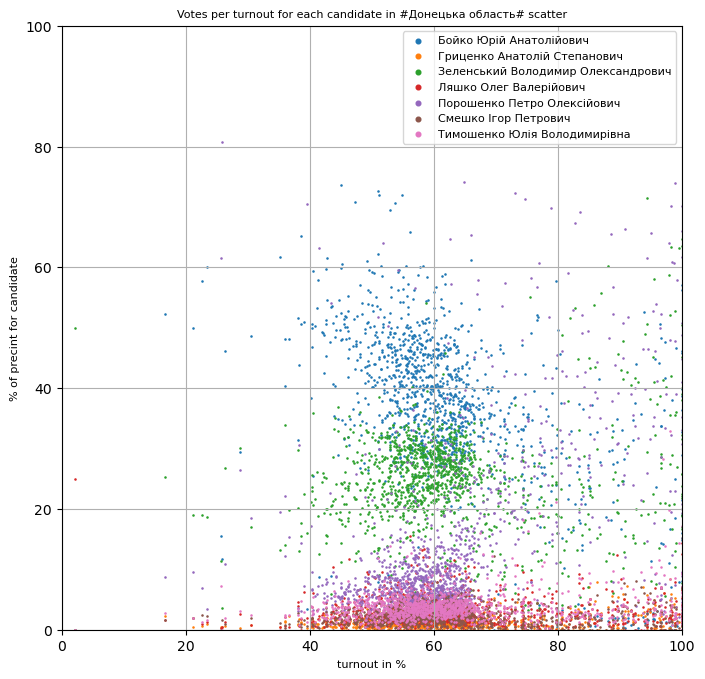

____________________________ Донецька область ________________________________________________________________________


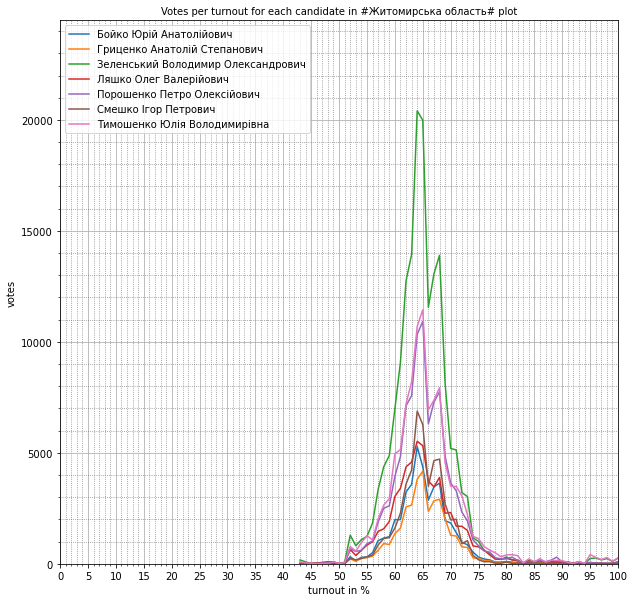

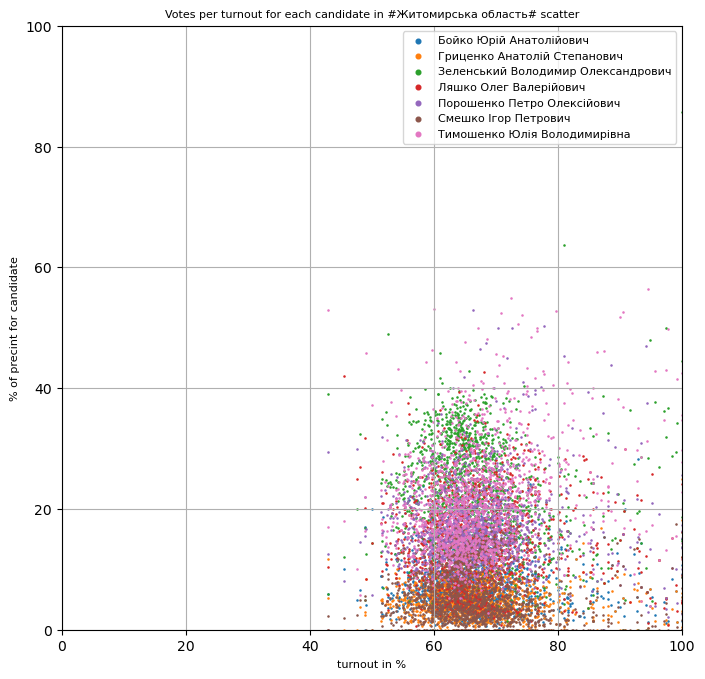

____________________________ Житомирська область ________________________________________________________________________


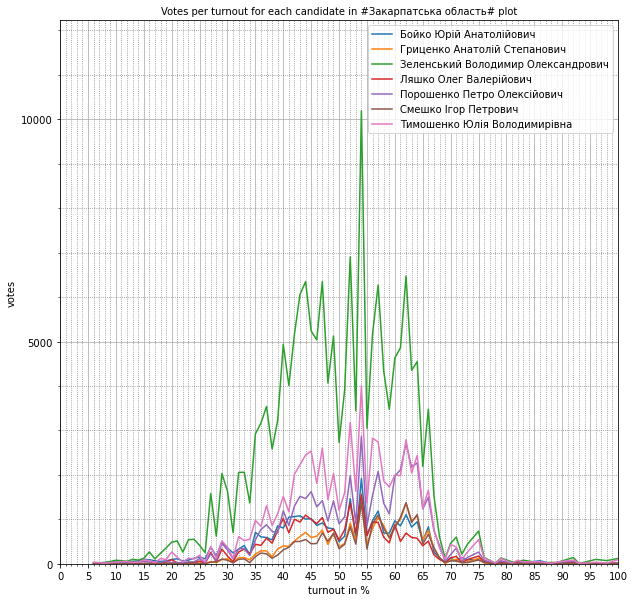

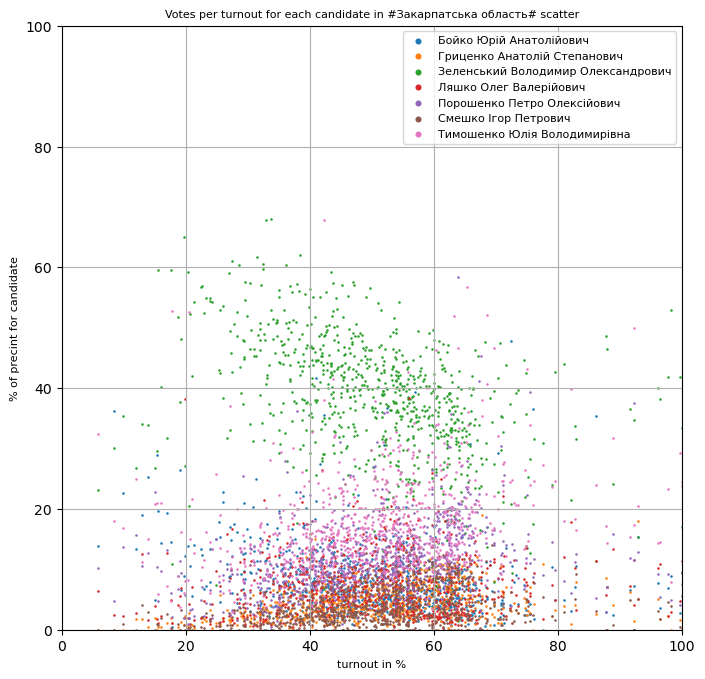

____________________________ Закарпатська область ________________________________________________________________________


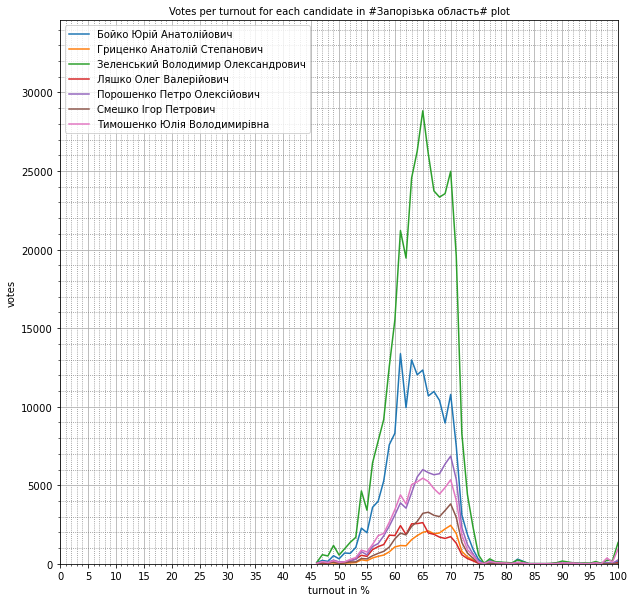

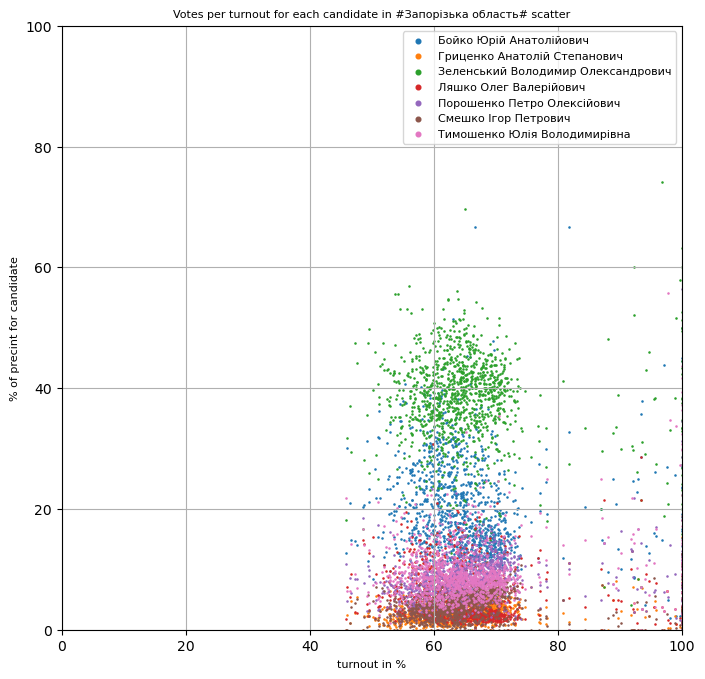

____________________________ Запорізька область ________________________________________________________________________


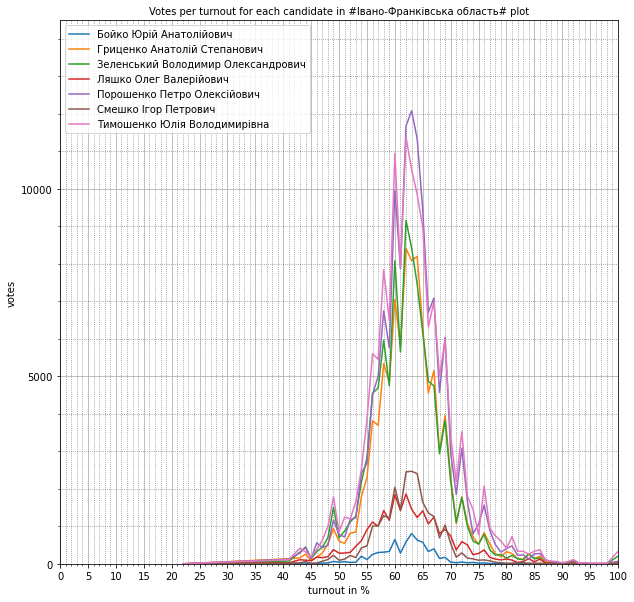

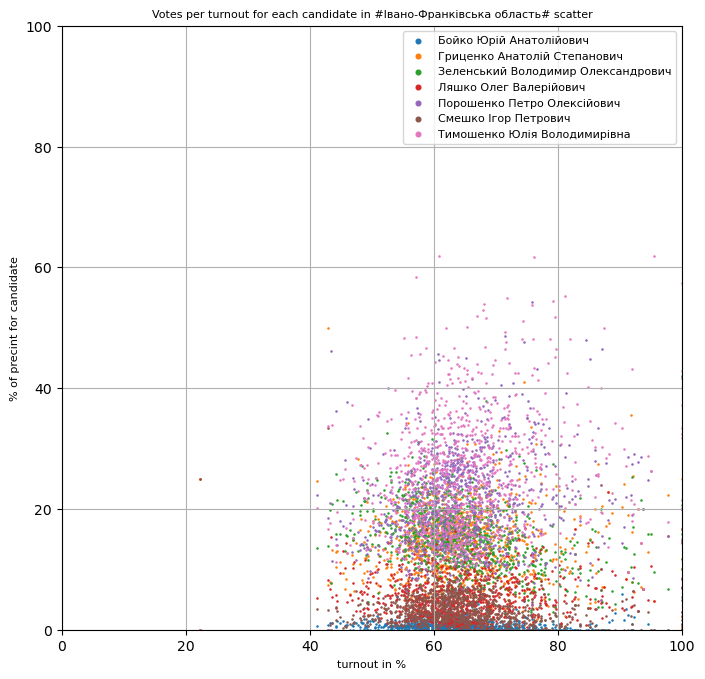

____________________________ Івано-Франківська область ________________________________________________________________________


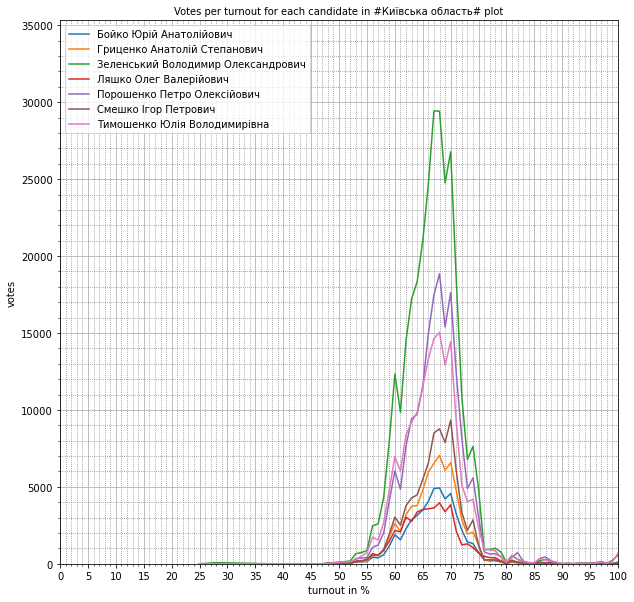

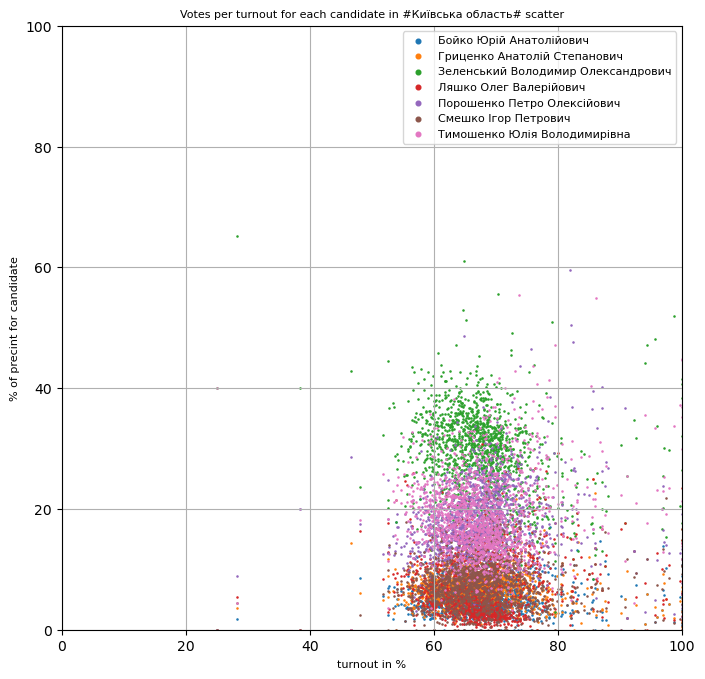

____________________________ Київська область ________________________________________________________________________


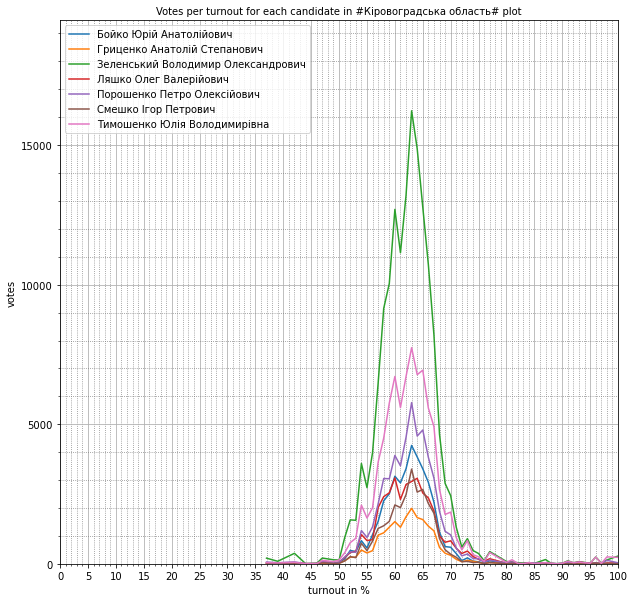

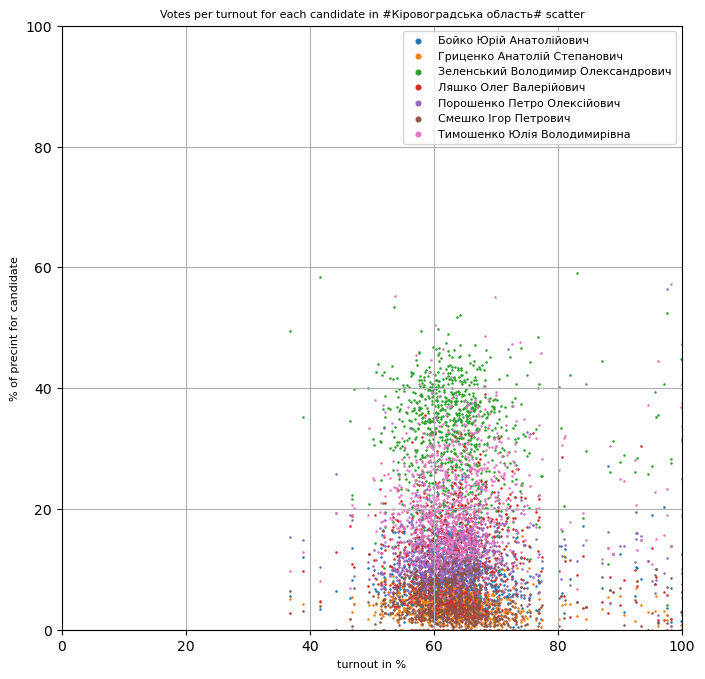

____________________________ Кіровоградська область ________________________________________________________________________


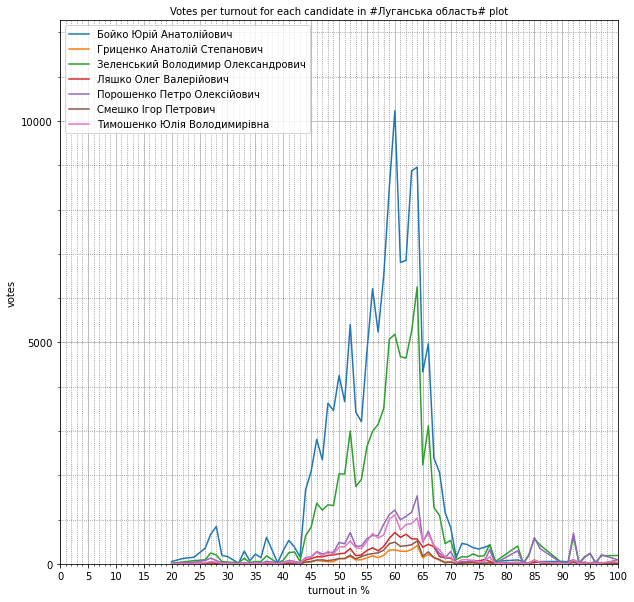

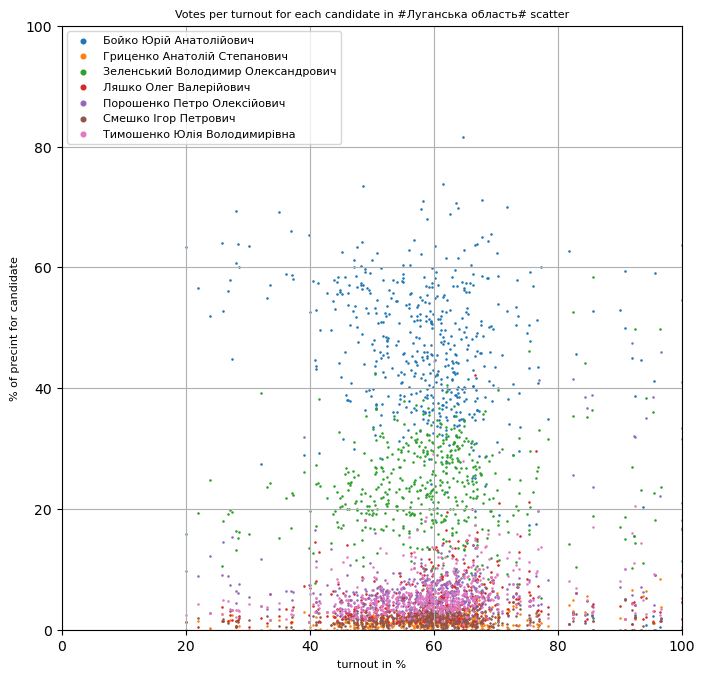

____________________________ Луганська область ________________________________________________________________________


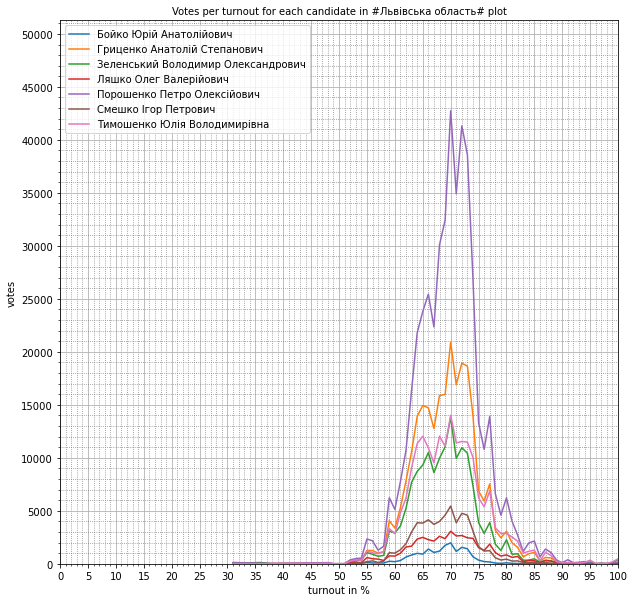

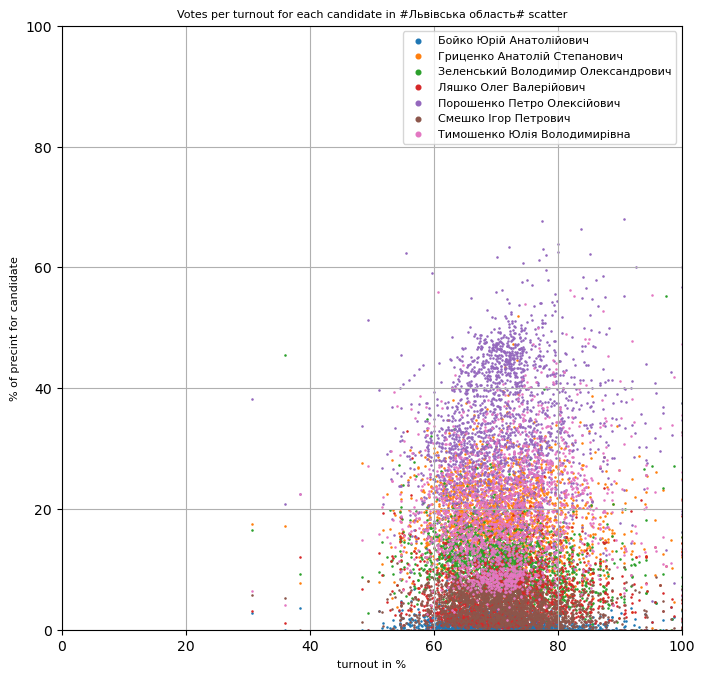

____________________________ Львівська область ________________________________________________________________________


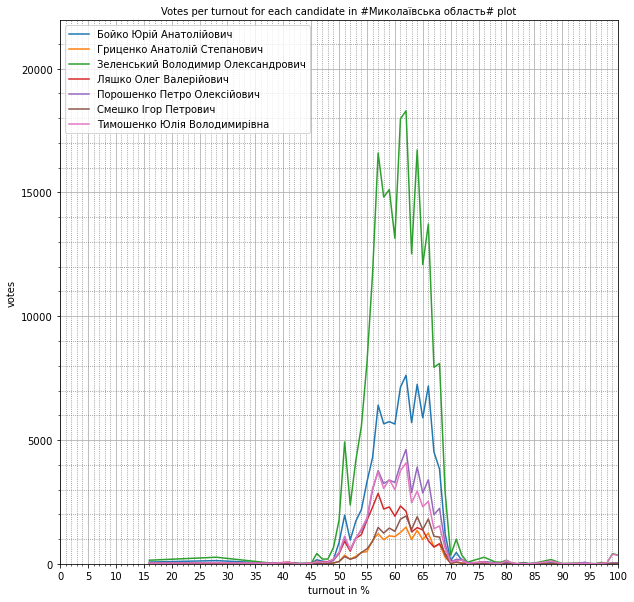

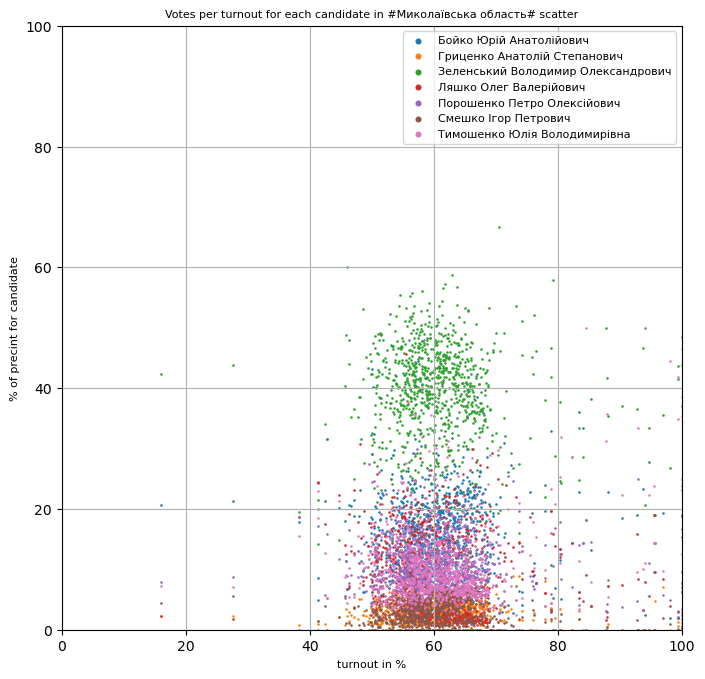

____________________________ Миколаївська область ________________________________________________________________________


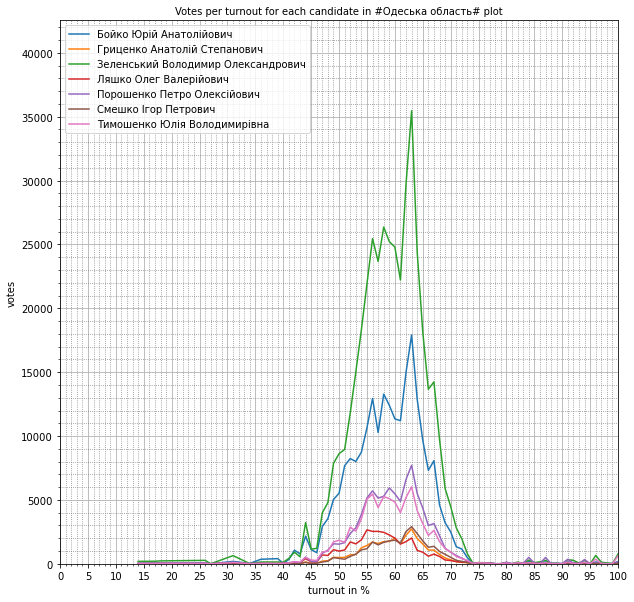

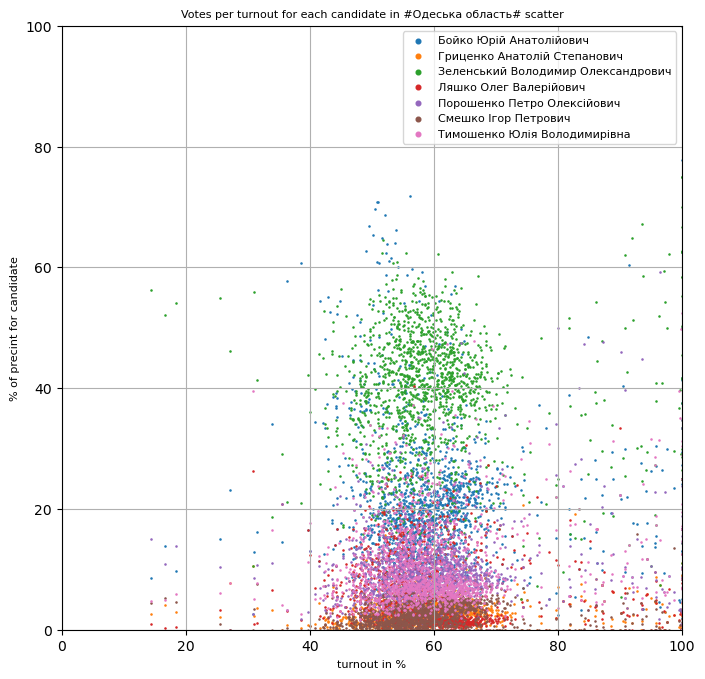

____________________________ Одеська область ________________________________________________________________________


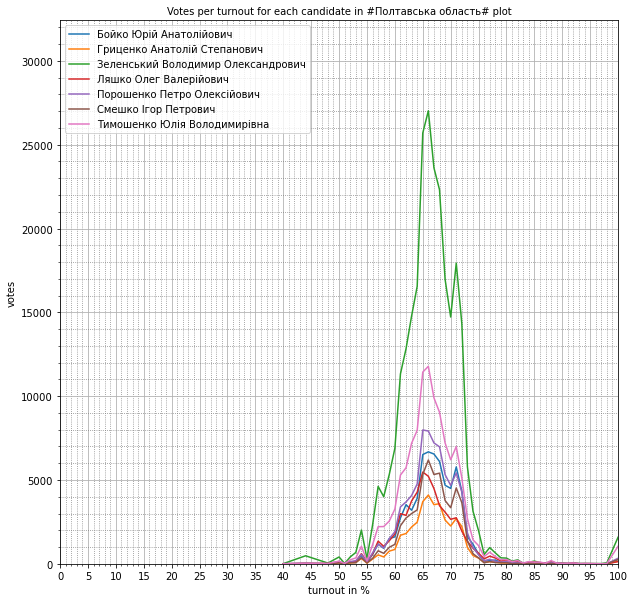

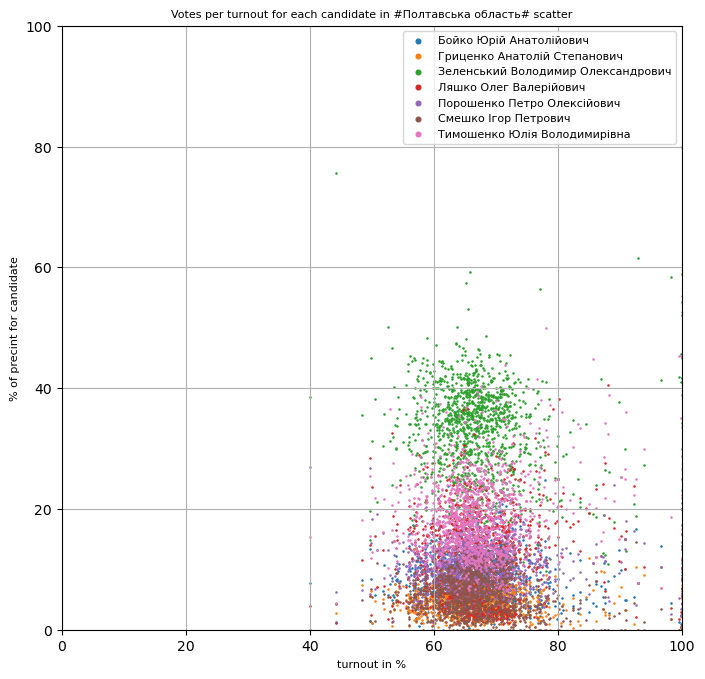

____________________________ Полтавська область ________________________________________________________________________


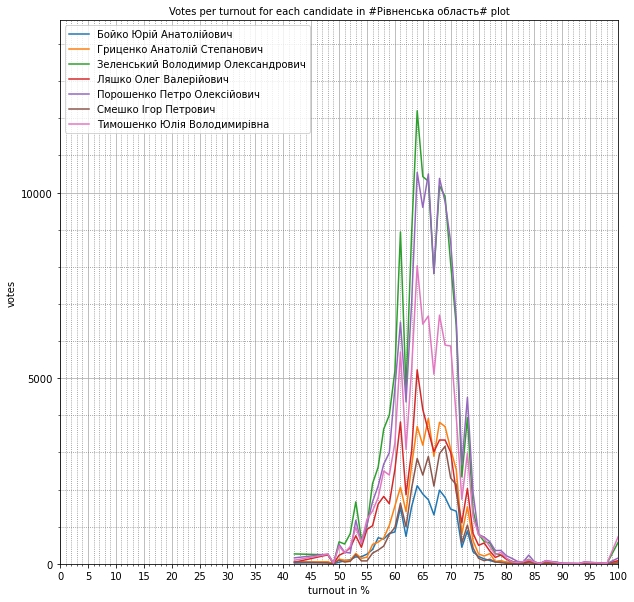

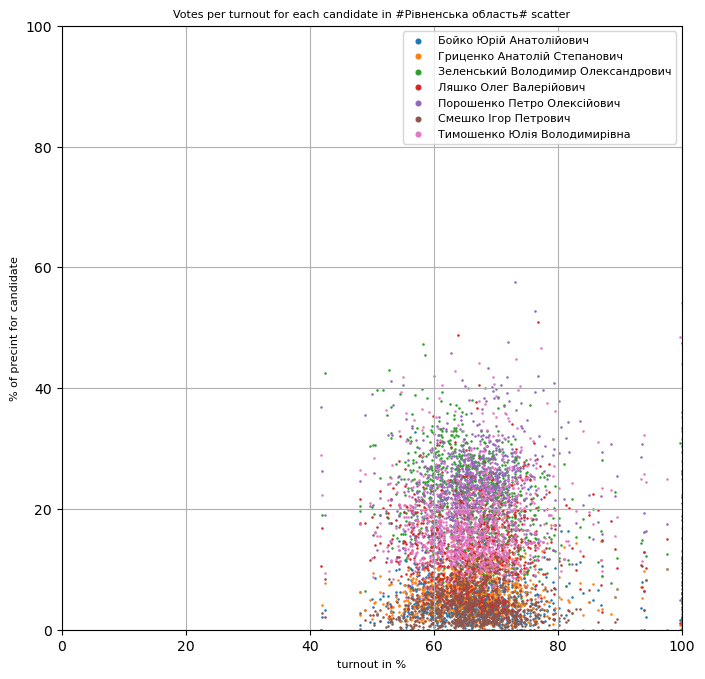

____________________________ Рівненська область ________________________________________________________________________


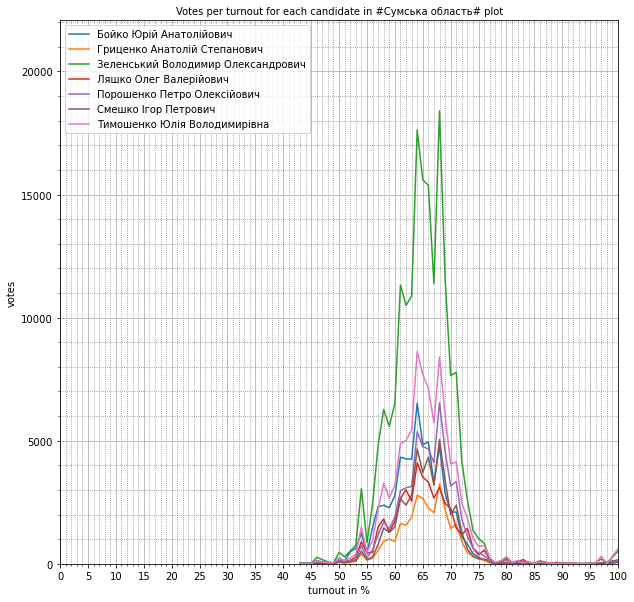

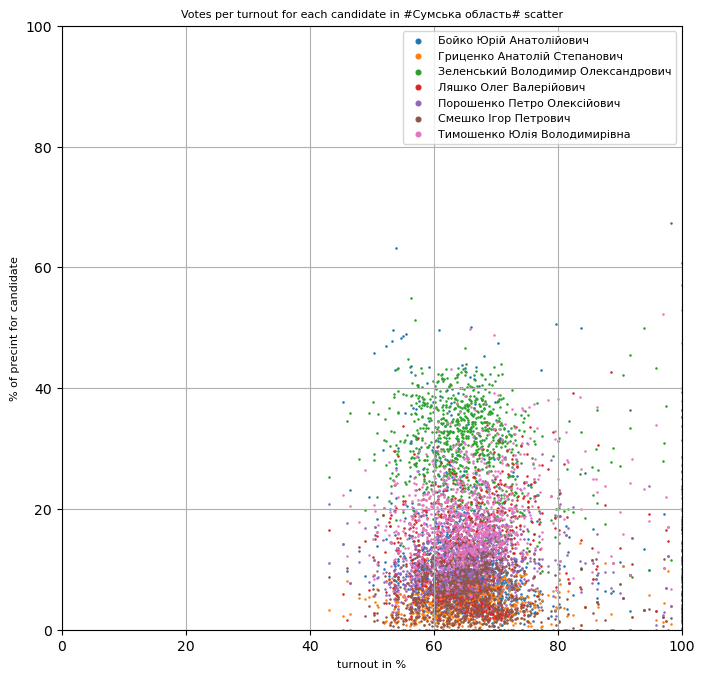

____________________________ Сумська область ________________________________________________________________________


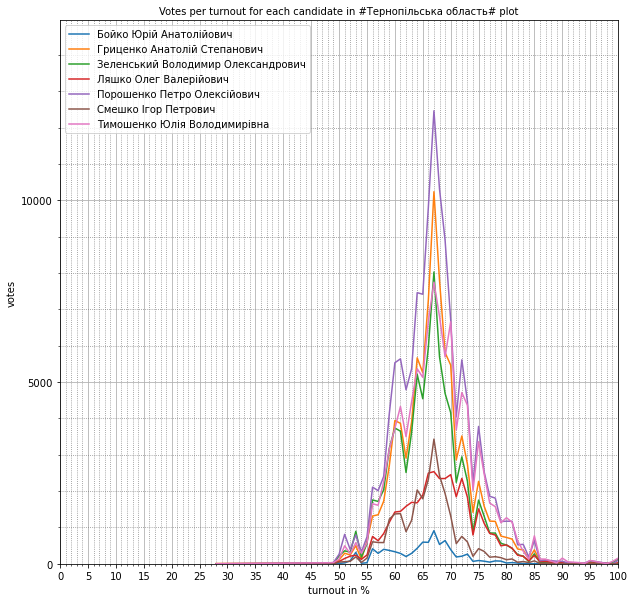

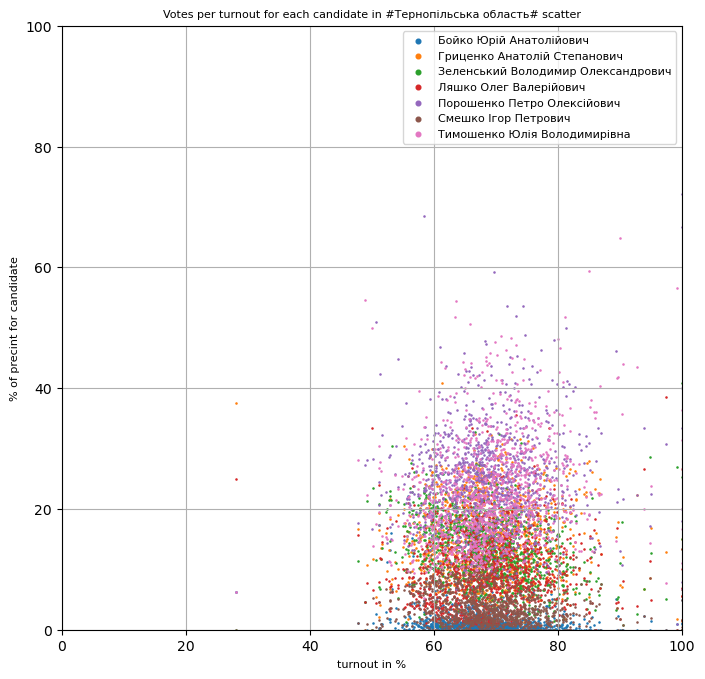

____________________________ Тернопільська область ________________________________________________________________________


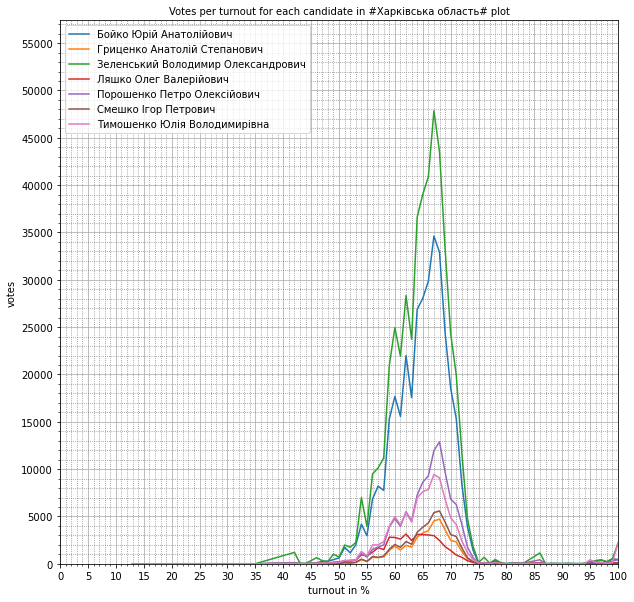

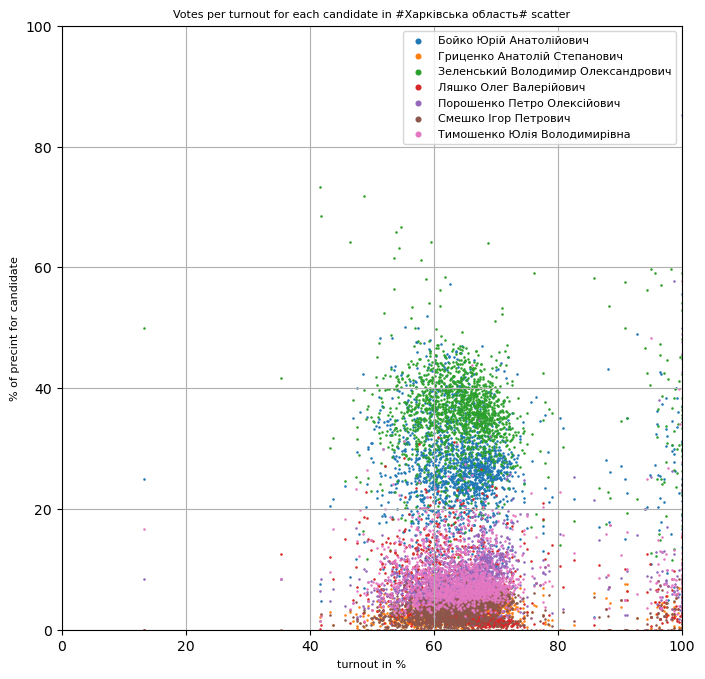

____________________________ Харківська область ________________________________________________________________________


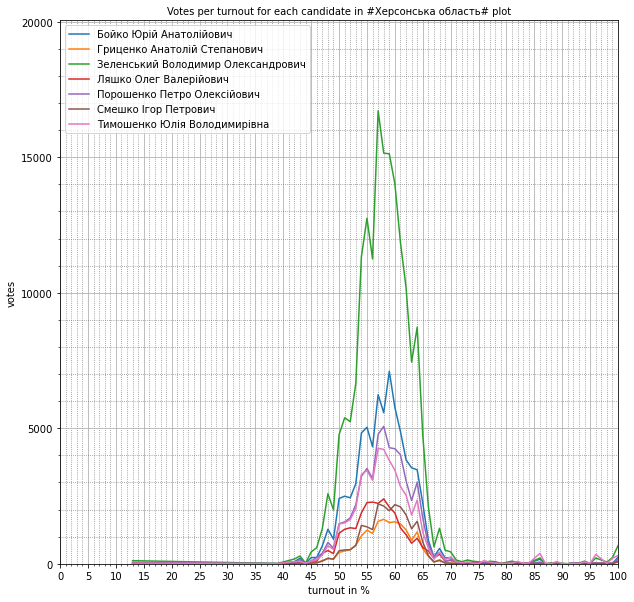

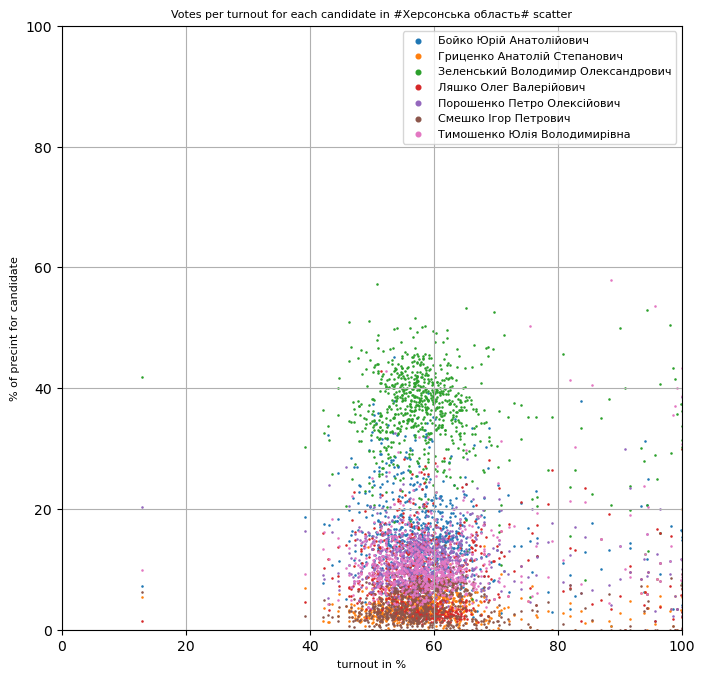

____________________________ Херсонська область ________________________________________________________________________


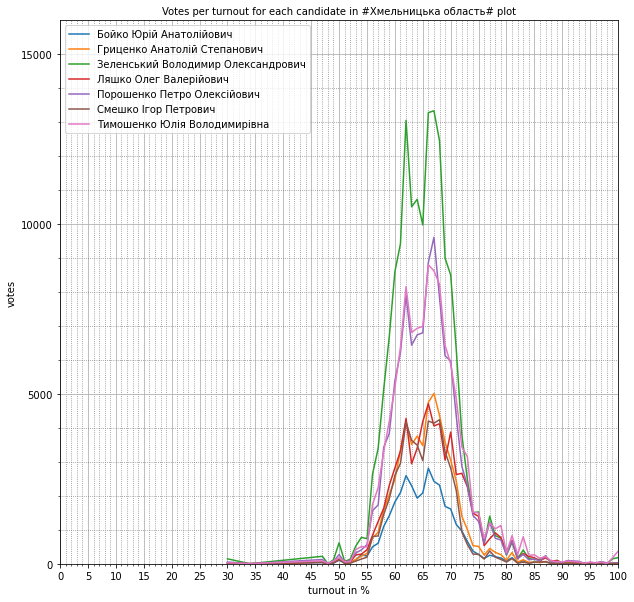

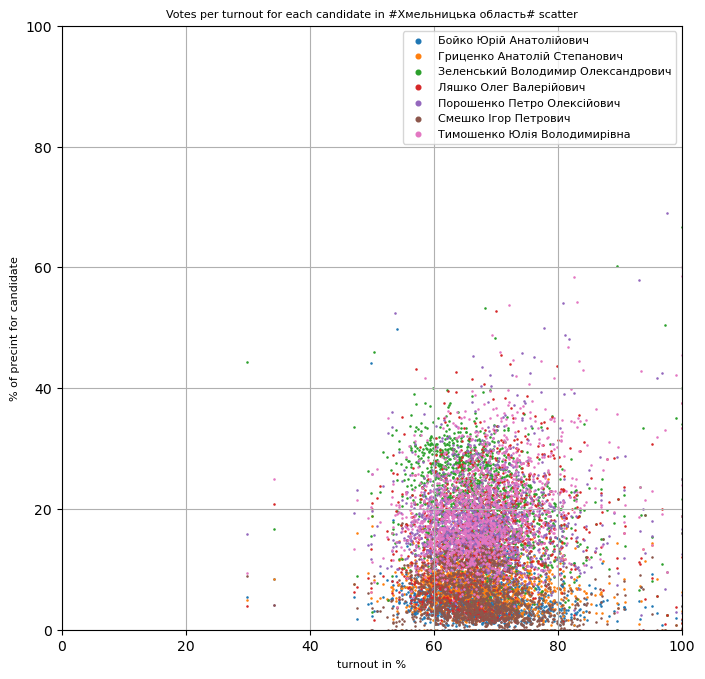

____________________________ Хмельницька область ________________________________________________________________________


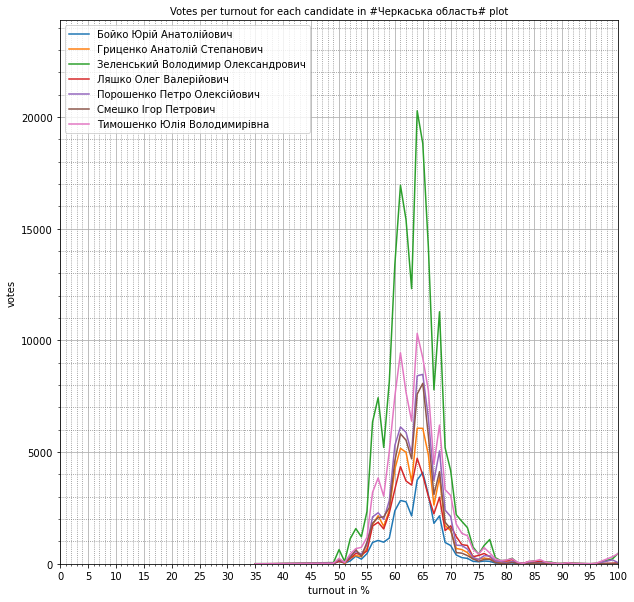

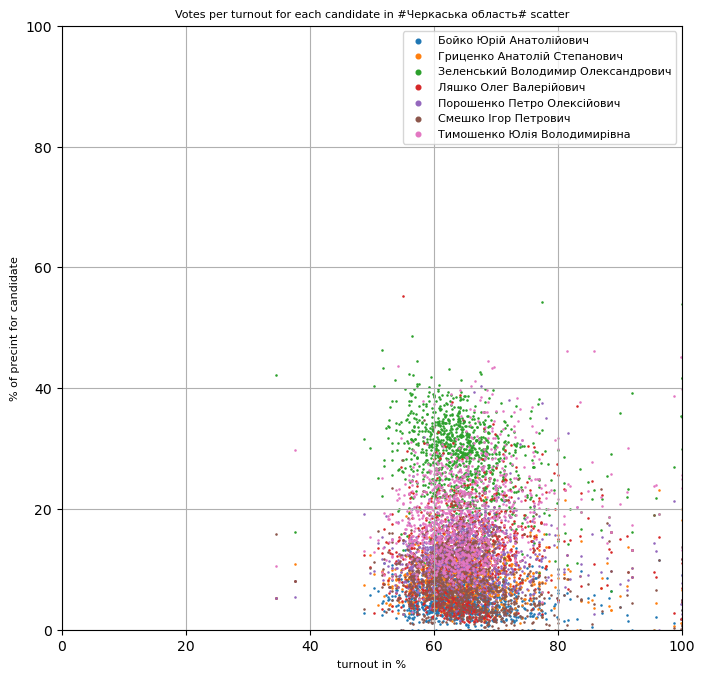

____________________________ Черкаська область ________________________________________________________________________


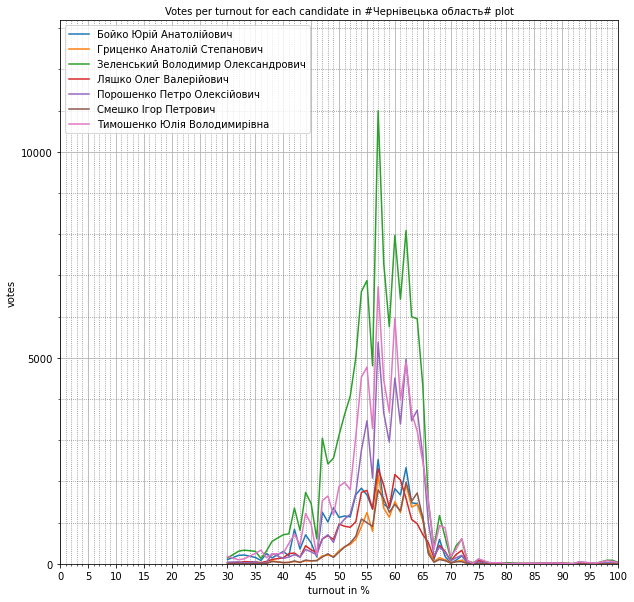

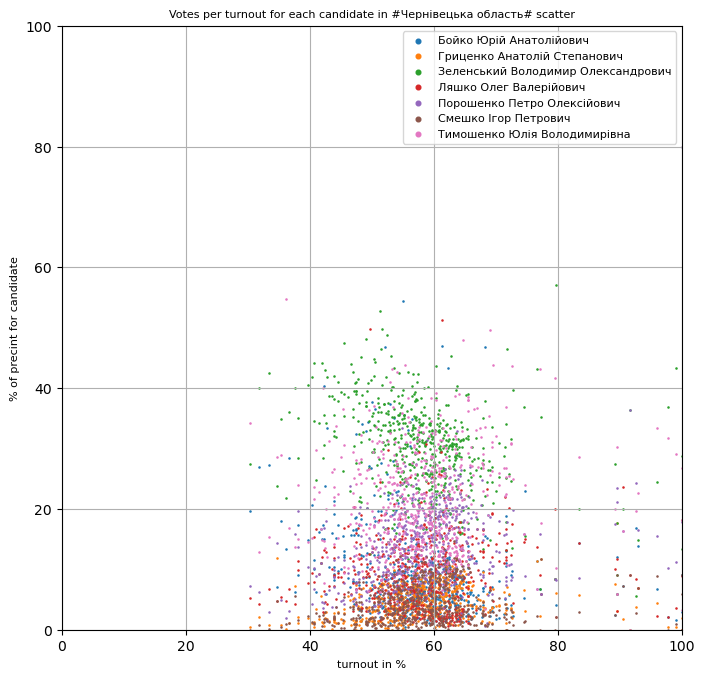

____________________________ Чернівецька область ________________________________________________________________________


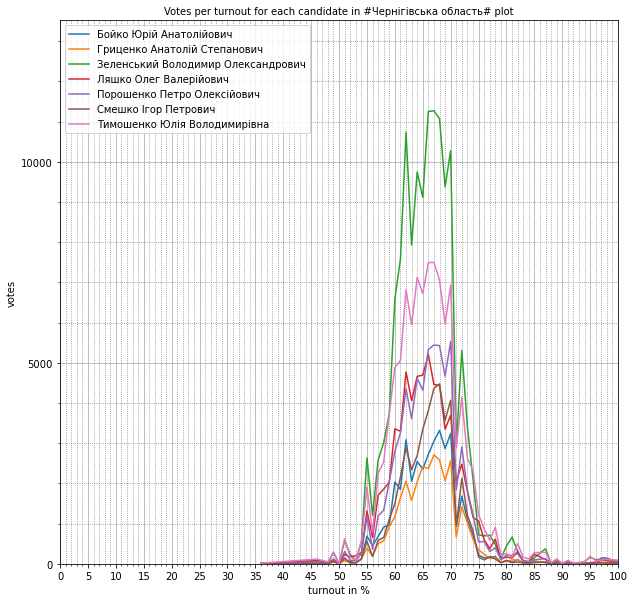

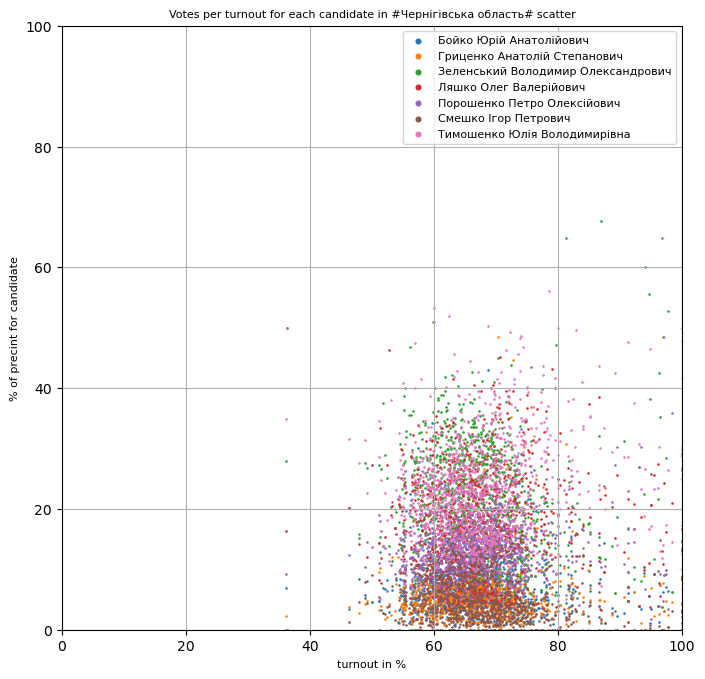

____________________________ Чернігівська область ________________________________________________________________________


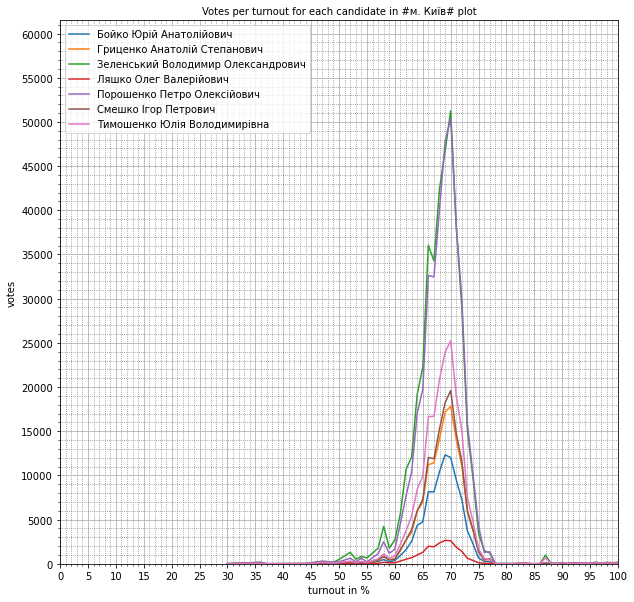

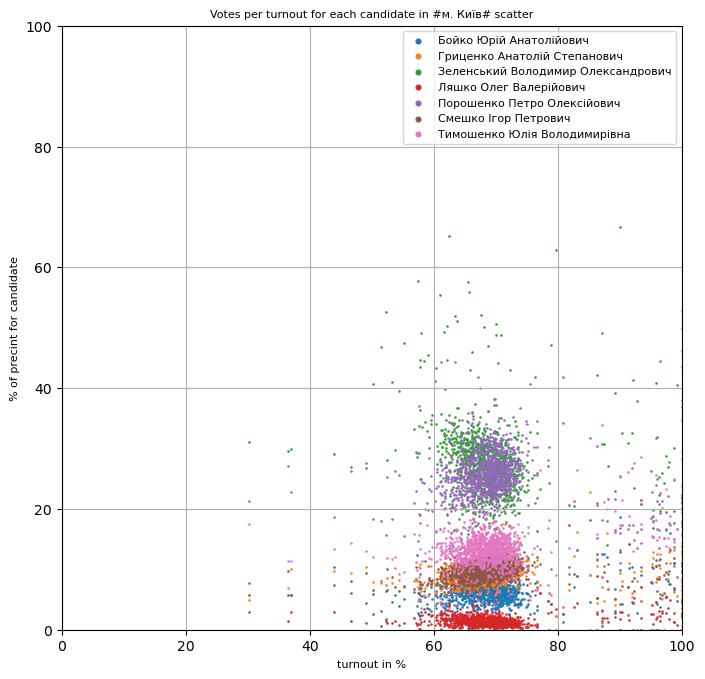

____________________________ м. Київ ________________________________________________________________________


In [34]:
# common variables
xmin, xlim = 0, 100
 # ticks
tick_x = 5

target_column = 'candidate'
target_list = concurence_candidates
region_list = list(results_total_joined[results_total_joined['region'] != 'За межами України']['region'].unique())

# variables for plot
weight_plot, hight_plot = 10 , 10
font_size_plot = 10
tick_y_plot = 5000

xlabel_plot = 'turnout in %'
ylabel_plot = 'votes'
x_column_plot = 'voted_total_percent_rounded'
y_column_plot = 'vote_count'

# variables for scatter
weight_scatter, hight_scatter = 8 , 8
font_size_scatter = 8
tick_y_scatter = 5

xlabel_scatter = 'turnout in %'
ylabel_scatter = '% of precint for candidate'
x_column_scatter = 'voted_total_percent'
y_column_scatter = 'candidate_percent_per_precint'


# loop for printing the plot and scatter for each region
for region in region_list:
    # making region's sample
    dataset_plot = results_total_joined[results_total_joined['region'] == region]
    # grouping per candidate
    dataset_plot = dataset_plot.groupby(['candidate', 'voted_total_percent_rounded']).sum().reset_index()
    
    dataset_scatter = results_total[results_total['region'] == region]
    
    # additional values for printing the plots
    # border for every plot
    ymin, ylim = 0, dataset_plot[y_column].max()+0.2 * dataset_plot[y_column].max()
    
    # plot name
    plot_name_plot = 'Votes per turnout for each candidate' +' in '+'#'+ region+'# plot'
    plot_name_scatter = 'Votes per turnout for each candidate' +' in '+'#'+ region+'# scatter'
    
    # printing the plot
    print_multiply_plot(dataset_plot, x_column=x_column_plot, y_column=y_column_plot, 
              target_column=target_column, target_list=target_list, mult_type='in_one',
              grid=True, hight=hight_plot, weight=weight_plot, 
              need_legend=True, legend_fontsize=font_size_plot, 
              plot_name=plot_name_plot,
              need_xlim=True, xlim=100, xmin=0, need_ylim=True, ylim=ylim, ymin=0,
              need_label = True, ylabel=ylabel_plot, xlabel=xlabel_plot, need_print='Y',
              need_tick=True, tick_x=tick_x, tick_y=tick_y_plot)
    # and scatter
    print_multiply_scatter(dataset_scatter, x_column=x_column_scatter, y_column=y_column_scatter, 
              target_column=target_column, target_list=target_list, mult_type='in_one',
              grid=True, hight=hight_scatter, weight=weight_scatter, 
              need_legend=True, legend_fontsize=font_size_scatter, 
              plot_name=plot_name_scatter,
              need_xlim=True, xlim=100, xmin=0, need_ylim=True, ylim=100, ymin=0,
              need_label = True, ylabel=ylabel_scatter, xlabel=xlabel_scatter, need_print='Y',
              need_tick=False, tick_x=tick_x, tick_y=tick_y_scatter)
    
    print('____________________________', region,'________________________________________________________________________')
    
    #there is not interest information about election in foreign countries
    

#### Check the relationship between Gricenko and Smeshko

In [35]:
# make a sample with Smeshko and Gricenko 
gricenko_smeshko_sample_plot = results_total_joined[(results_total_joined['candidate'] == 'Гриценко Анатолій Степанович') | 
                                               (results_total_joined['candidate'] == 'Смешко Ігор Петрович')]
gricenko_smeshko_sample_plot

,candidate,district_no,precinct_no,vote_count,region,rayon,community,votes_candidates,voted_total_percent_rounded
269901,Гриценко Анатолій Степанович,11,50130,73,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.0
959648,Смешко Ігор Петрович,11,50130,120,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.0
269902,Гриценко Анатолій Степанович,11,50131,97,Вінницька область,Вінницький район,Стрижавська селищна рада,1341,64.0
959649,Смешко Ігор Петрович,11,50131,147,Вінницька область,Вінницький район,Стрижавська селищна рада,1341,64.0
269903,Гриценко Анатолій Степанович,11,50132,48,Вінницька область,Вінницький район,Стрижавська селищна рада,822,66.0
...,...,...,...,...,...,...,...,...,...
989634,Смешко Ігор Петрович,226,900123,6,За межами України,NaN,NaN,59,65.0
299888,Гриценко Анатолій Степанович,226,900124,9,За межами України,NaN,NaN,122,77.0
989635,Смешко Ігор Петрович,226,900124,6,За межами України,NaN,NaN,122,77.0
299889,Гриценко Анатолій Степанович,226,900125,34,За межами України,NaN,NaN,232,26.0


In [36]:
# dividing data per sample with gricenko and smeshko
gricenko_data = results_total[(results_total['candidate'] == 'Гриценко Анатолій Степанович')]
smeshko_data = results_total[(results_total['candidate'] == 'Смешко Ігор Петрович')]
smeshko_data

,candidate,district_no,precinct_no,vote_count,region,rayon,community,votes_candidates,voted_total_percent,candidate_percent_per_precint
959648,Смешко Ігор Петрович,11,50130,120,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.48,10.899183
959649,Смешко Ігор Петрович,11,50131,147,Вінницька область,Вінницький район,Стрижавська селищна рада,1341,64.39,10.961969
959650,Смешко Ігор Петрович,11,50132,95,Вінницька область,Вінницький район,Стрижавська селищна рада,822,65.60,11.557178
959651,Смешко Ігор Петрович,11,50133,186,Вінницька область,Вінницький район,Стрижавська селищна рада,1583,65.48,11.749842
959652,Смешко Ігор Петрович,11,50134,14,Вінницька область,Вінницький район,Стрижавська селищна рада,140,62.22,10.000000
...,...,...,...,...,...,...,...,...,...,...
989632,Смешко Ігор Петрович,226,900121,60,За межами України,NaN,NaN,540,13.02,11.111111
989633,Смешко Ігор Петрович,226,900122,111,За межами України,NaN,NaN,1434,6.79,7.740586
989634,Смешко Ігор Петрович,226,900123,6,За межами України,NaN,NaN,59,64.83,10.169492
989635,Смешко Ігор Петрович,226,900124,6,За межами України,NaN,NaN,122,77.21,4.918033


In [37]:
# creating new dataframe gricenko_smeshko_corr which contain percents of votes in precint per smeshko and gricenko
gricenko_smeshko_corr = smeshko_data.drop(columns=['candidate', 'votes_candidates']).reset_index(drop=True)
gricenko_smeshko_corr['gricenko_percent'] = gricenko_data['candidate_percent_per_precint'].reset_index(drop=True)
gricenko_smeshko_corr['smeshko_percent'] = smeshko_data['candidate_percent_per_precint'].reset_index(drop=True)

# see the correlation
correlation_value = gricenko_smeshko_corr['gricenko_percent'].corr(gricenko_smeshko_corr['smeshko_percent'])
correlation_value = 'corr = ' + str(np.round(correlation_value, 3))

# target column s necessary fr using my functions for printing the scatter and it is printe the value from it
gricenko_smeshko_corr['target'] = correlation_value

gricenko_smeshko_corr

,district_no,precinct_no,vote_count,region,rayon,community,voted_total_percent,candidate_percent_per_precint,gricenko_percent,smeshko_percent,target
0,11,50130,120,Вінницька область,Вінницький район,Стрижавська селищна рада,66.48,10.899183,6.630336,10.899183,corr = 0.155
1,11,50131,147,Вінницька область,Вінницький район,Стрижавська селищна рада,64.39,10.961969,7.233408,10.961969,corr = 0.155
2,11,50132,95,Вінницька область,Вінницький район,Стрижавська селищна рада,65.60,11.557178,5.839416,11.557178,corr = 0.155
3,11,50133,186,Вінницька область,Вінницький район,Стрижавська селищна рада,65.48,11.749842,5.938092,11.749842,corr = 0.155
4,11,50134,14,Вінницька область,Вінницький район,Стрижавська селищна рада,62.22,10.000000,8.571429,10.000000,corr = 0.155
...,...,...,...,...,...,...,...,...,...,...,...
29984,226,900121,60,За межами України,NaN,NaN,13.02,11.111111,14.444444,11.111111,corr = 0.155
29985,226,900122,111,За межами України,NaN,NaN,6.79,7.740586,6.624826,7.740586,corr = 0.155
29986,226,900123,6,За межами України,NaN,NaN,64.83,10.169492,10.169492,10.169492,corr = 0.155
29987,226,900124,6,За межами України,NaN,NaN,77.21,4.918033,7.377049,4.918033,corr = 0.155


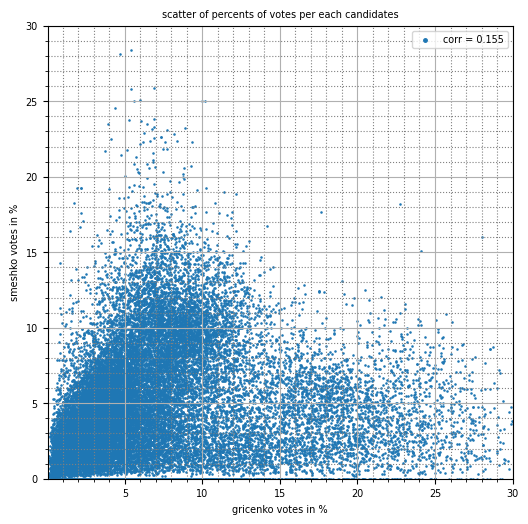

In [38]:
# common variables
xmin, xlim = 0, 100
 # ticks
tick_x = 5
tick_y = 5

target_column = 'target'
target_list = [correlation_value]

# variables for scatter
weight_scatter, hight_scatter = 6 , 6
font_size_scatter = 7

xlabel_scatter = 'gricenko votes in %'
ylabel_scatter = 'smeshko votes in %'
x_column_scatter = 'gricenko_percent'
y_column_scatter = 'smeshko_percent'

plot_name = 'scatter of percents of votes per each candidates'

# printing the scatter of correlations
print_multiply_scatter(gricenko_smeshko_corr, x_column=x_column_scatter, y_column=y_column_scatter, 
              target_column=target_column, target_list=target_list, mult_type='in_one',
              grid=True, hight=hight_scatter, weight=weight_scatter, 
              need_legend=True, legend_fontsize=font_size_scatter,
              plot_name=plot_name,
              need_xlim=True, xlim=30, xmin=0.01, need_ylim=True, ylim=30, ymin=0,
              need_label=True, ylabel=ylabel_scatter, xlabel=xlabel_scatter,
              need_tick=True, tick_x=tick_x, tick_y=tick_y) 

In [39]:
# list in which values about region and corr_value per region will be contained 
region_list = []
corr_val_list = []

# walking into ukrainian regions and counting the correlation for Gricenko/Smeshko relationship
for region in gricenko_smeshko_corr['region'].unique():
    gricenko_smeshko_regional_corr = gricenko_smeshko_corr[gricenko_smeshko_corr['region'] == region]
    correlation_value = gricenko_smeshko_regional_corr['gricenko_percent'].corr(
                        gricenko_smeshko_regional_corr['smeshko_percent'])
    correlation_value_str = 'corr = ' + str(np.round(correlation_value, 3))
    
    # adding new values to list
    region_list.append(region)
    corr_val_list.append(correlation_value)
    
# creating dataframe which contains regions and their correlation values
region_corr_tab = pd.DataFrame(columns=['region', 'correlation_value'], 
                               index=[i for i in range(len(region_list))])
region_corr_tab['region'] = pd.Series(region_list)
region_corr_tab['correlation_value'] = pd.Series(corr_val_list)

region_corr_tab

,region,correlation_value
0,Вінницька область,0.309552
1,Волинська область,0.414182
2,Дніпропетровська область,0.327999
3,Донецька область,0.366323
4,Житомирська область,0.233900
5,Закарпатська область,0.603844
6,Запорізька область,0.415657
7,Івано-Франківська область,0.275522
8,Київська область,0.143228
9,Кіровоградська область,0.363869


In [40]:
# for region in gricenko_smeshko_corr['region'].unique():
#     print(gricenko_smeshko_corr[gricenko_smeshko_corr['region']==region][['region', 'gricenko_percent', 'smeshko_percent']])

region_corr_tab[region_corr_tab['region'] == region]

,region,correlation_value
25,За межами України,0.304229


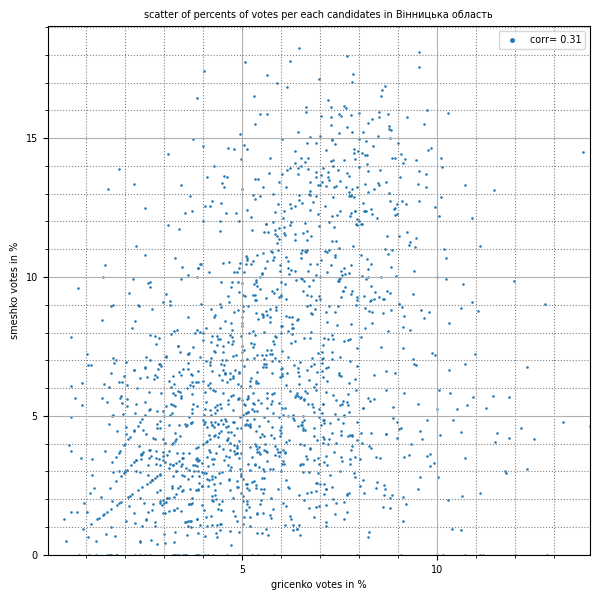

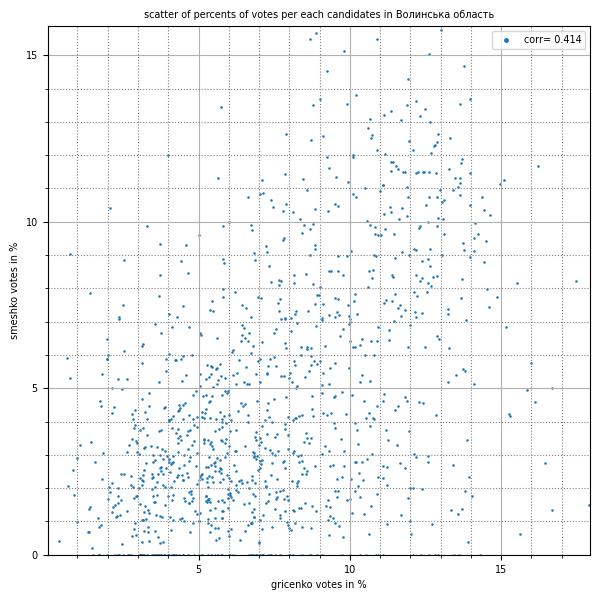

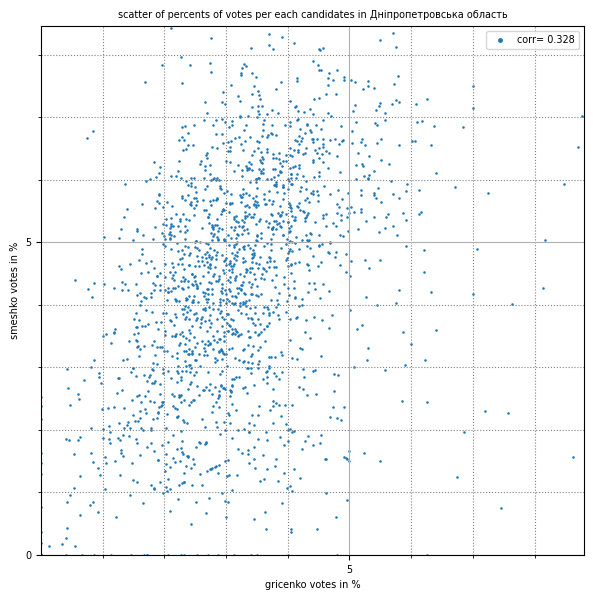

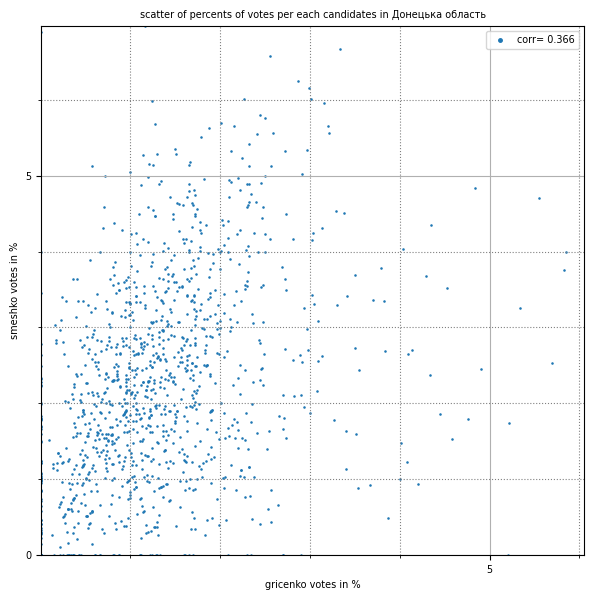

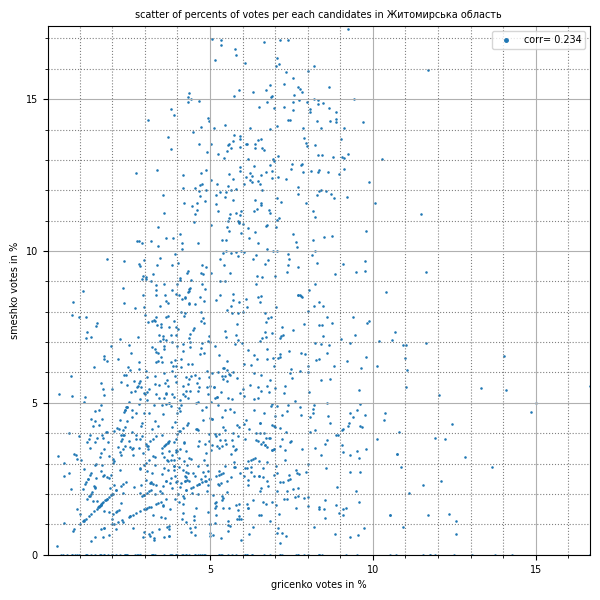

...

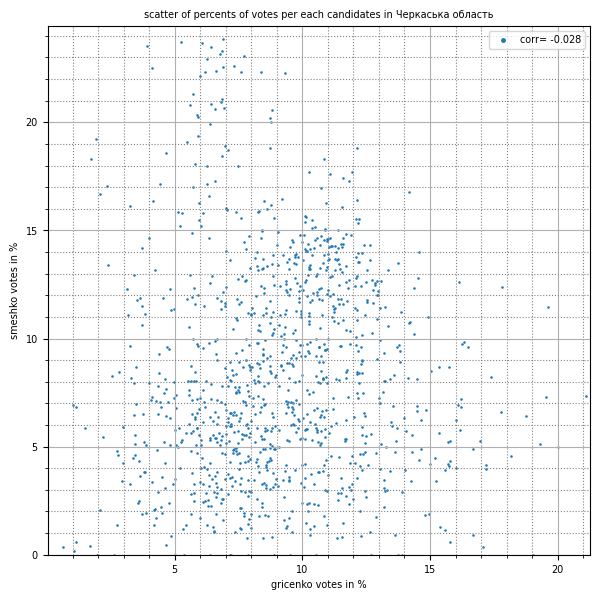

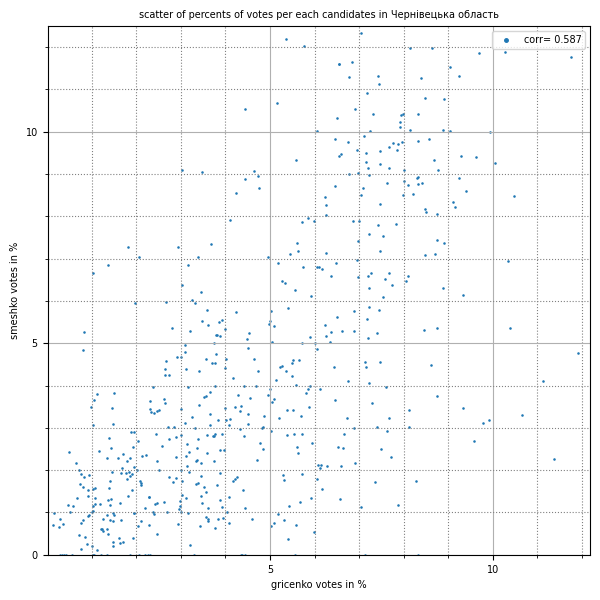

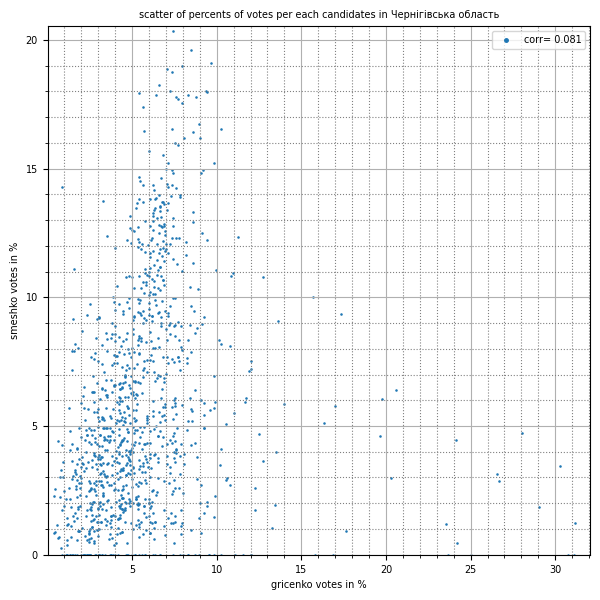

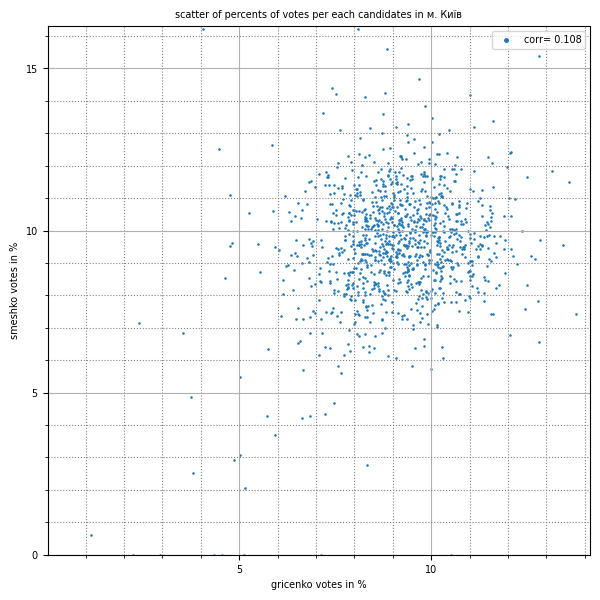

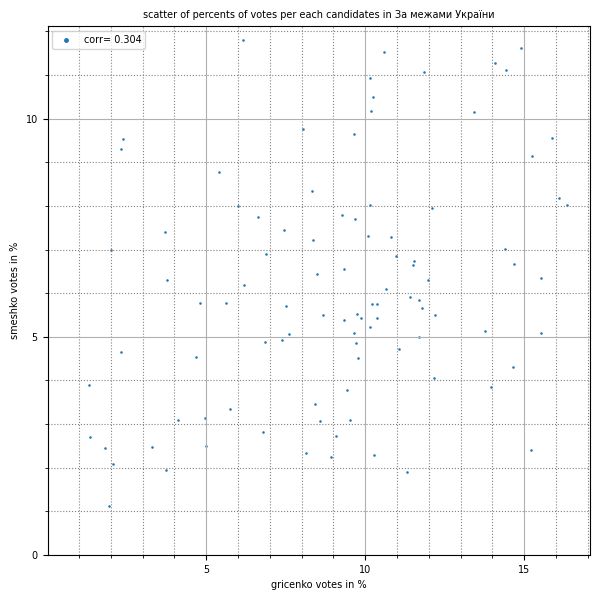

In [41]:
# common variables
xmin, xlim = 0, 100
 # ticks
tick_x = 5
tick_y = 5

target_column = 'target'

# variables for scatter
weight_scatter, hight_scatter = 7 , 7
font_size_scatter = 7

xlabel_scatter = 'gricenko votes in %'
ylabel_scatter = 'smeshko votes in %'
x_column_scatter = 'gricenko_percent'
y_column_scatter = 'smeshko_percent'

plot_name = 'scatter of percents of votes per each candidates'

for region in gricenko_smeshko_corr['region'].unique():
    correlation_value = 'corr= '+ str(np.round(float(region_corr_tab[region_corr_tab['region'] == region].values[[0],[1]]), 3))
    gricenko_smeshko_region_df = gricenko_smeshko_corr[gricenko_smeshko_corr['region'] == region].drop('target', axis=1)
    gricenko_smeshko_region_df['target'] = correlation_value
    target_list = [correlation_value]
    
    # scatter var
    xlim = gricenko_smeshko_region_df['gricenko_percent'].quantile(0.995, interpolation = 'linear')
    ylim = gricenko_smeshko_region_df['smeshko_percent'].quantile(0.995, interpolation = 'linear')
    
    print_multiply_scatter(gricenko_smeshko_region_df, 
            x_column=x_column_scatter, y_column=y_column_scatter, 
              target_column=target_column, target_list=[correlation_value], mult_type='in_one',
              grid=True, hight=hight_scatter, weight=weight_scatter, 
              need_legend=True, legend_fontsize=font_size_scatter,
              plot_name=plot_name+' in '+str(region),
              need_xlim=True, xlim=xlim, xmin=0.01, need_ylim=True, ylim=ylim, ymin=0,
              need_label=True, ylabel=ylabel_scatter, xlabel=xlabel_scatter, need_print='Y',
              need_tick=True, tick_x=tick_x, tick_y=tick_y) 


In [42]:
gricenko_smeshko_region_df

,district_no,precinct_no,vote_count,region,rayon,community,voted_total_percent,candidate_percent_per_precint,gricenko_percent,smeshko_percent,target
29888,226,900001,3,За межами України,NaN,NaN,7.19,2.400000,15.200000,2.400000,corr= 0.304
29889,226,900002,60,За межами України,NaN,NaN,39.30,6.335797,15.522703,6.335797,corr= 0.304
29890,226,900003,4,За межами України,NaN,NaN,61.40,2.285714,10.285714,2.285714,corr= 0.304
29891,226,900004,5,За межами України,NaN,NaN,22.41,7.692308,0.000000,7.692308,corr= 0.304
29892,226,900005,23,За межами України,NaN,NaN,18.66,11.794872,6.153846,11.794872,corr= 0.304
...,...,...,...,...,...,...,...,...,...,...,...
29984,226,900121,60,За межами України,NaN,NaN,13.02,11.111111,14.444444,11.111111,corr= 0.304
29985,226,900122,111,За межами України,NaN,NaN,6.79,7.740586,6.624826,7.740586,corr= 0.304
29986,226,900123,6,За межами України,NaN,NaN,64.83,10.169492,10.169492,10.169492,corr= 0.304
29987,226,900124,6,За межами України,NaN,NaN,77.21,4.918033,7.377049,4.918033,corr= 0.304


In [43]:
gricenko_smeshko_sample_scatter = results_total[(results_total['candidate'] == 'Гриценко Анатолій Степанович') | 
                                                (results_total['candidate'] == 'Смешко Ігор Петрович')]
gricenko_smeshko_sample_scatter

,candidate,district_no,precinct_no,vote_count,region,rayon,community,votes_candidates,voted_total_percent,candidate_percent_per_precint
269901,Гриценко Анатолій Степанович,11,50130,73,Вінницька область,Вінницький район,Стрижавська селищна рада,1101,66.48,6.630336
269902,Гриценко Анатолій Степанович,11,50131,97,Вінницька область,Вінницький район,Стрижавська селищна рада,1341,64.39,7.233408
269903,Гриценко Анатолій Степанович,11,50132,48,Вінницька область,Вінницький район,Стрижавська селищна рада,822,65.60,5.839416
269904,Гриценко Анатолій Степанович,11,50133,94,Вінницька область,Вінницький район,Стрижавська селищна рада,1583,65.48,5.938092
269905,Гриценко Анатолій Степанович,11,50134,12,Вінницька область,Вінницький район,Стрижавська селищна рада,140,62.22,8.571429
...,...,...,...,...,...,...,...,...,...,...
989632,Смешко Ігор Петрович,226,900121,60,За межами України,NaN,NaN,540,13.02,11.111111
989633,Смешко Ігор Петрович,226,900122,111,За межами України,NaN,NaN,1434,6.79,7.740586
989634,Смешко Ігор Петрович,226,900123,6,За межами України,NaN,NaN,59,64.83,10.169492
989635,Смешко Ігор Петрович,226,900124,6,За межами України,NaN,NaN,122,77.21,4.918033


#### Printing the scatter of percent of votes in precint per turnout in summary for 

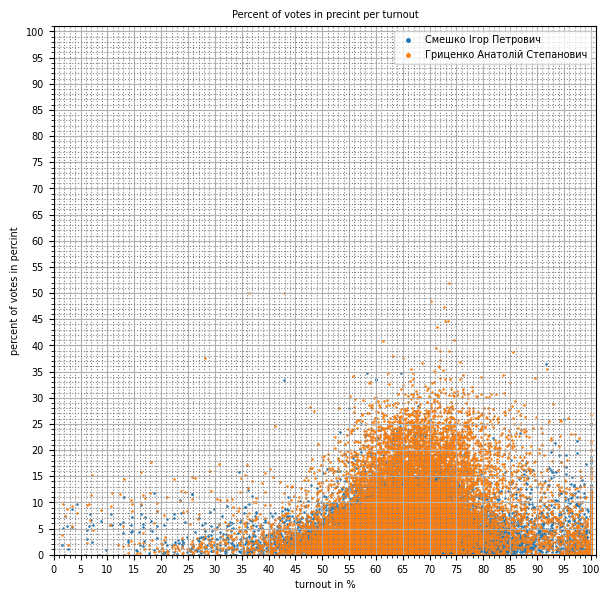

In [44]:
# prnting the percent's distribution for every candidate in one scatter
print_multiply_scatter(gricenko_smeshko_sample_scatter, x_column='voted_total_percent', y_column='candidate_percent_per_precint', 
              target_column='candidate', target_list=['Смешко Ігор Петрович','Гриценко Анатолій Степанович'], mult_type='in_one',
              grid=True, hight=7, weight=7, 
              need_legend=True, legend_fontsize=7,
              plot_name='Percent of votes in precint per turnout',
              need_xlim=True, xlim=101, xmin=0, need_ylim=True, ylim=101, ymin=0,
              need_label=True, ylabel='percent of votes in percint', xlabel='turnout in %',
              need_tick=True, tick_x=5, tick_y=5)  

# Summary

1. The distribution of distribution of votes per turnout in precints is normal. The are no outliers in right side of plot. The first tour of presidental elections is fair
2. Per regions, there were no extremal turnouts for one candidate (in power).
3. Information that Smeshko was technical candidate for deriving votes from Gricenko is not proof in statisitical sense. There was not strong correlation between two candidates. Per regions, only Zakarpatska gives a correlation more than 0.5.